## Phase 0: Environment Setup & Library Installation

In [ ]:
# Install required libraries
!pip install -q timm imagehash scikit-learn seaborn matplotlib opencv-python-headless

import os
import sys
import random
import shutil
import warnings
import math
import time
import json
import copy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from pathlib import Path
from PIL import Image, ImageFilter, ImageEnhance
from collections import Counter, defaultdict
from tqdm.notebook import tqdm
import imagehash
import cv2

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models
import timm

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, balanced_accuracy_score, precision_score, recall_score, f1_score,
    matthews_corrcoef, cohen_kappa_score, roc_auc_score,
    confusion_matrix, classification_report, roc_curve, auc,
    precision_recall_curve, average_precision_score,
)
from sklearn.preprocessing import label_binarize

warnings.filterwarnings('ignore')

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {DEVICE}')
if torch.cuda.is_available():
    print(f'GPU: {torch.cuda.get_device_name(0)}')
    print(f'VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB')

Device: cuda
GPU: Tesla T4
VRAM: 15.64 GB


## Phase 1: Configuration & Dataset Path Setup

In [ ]:
from google.colab import drive

# # 1. Mount Google Drive
# drive.mount('/content/drive/', force_remount=False)

# # ============================================================
# # CONFIGURATION -- Set path to your dataset in Google Drive
# # ============================================================

# # CHANGE THIS to match the exact path of your dataset folder in Google Drive.
# # Expected structure (same as the reference notebook):
# #   <DRIVE_DATASET_PATH>/
# #       ClassA/  img1.jpg  img2.jpg  ...
# #       ClassB/  img1.jpg  img2.jpg  ...
# #       ...
# DRIVE_DATASET_PATH = Path('/content/drive/MyDrive/ColoredFlowersBD')

# if DRIVE_DATASET_PATH.exists():
#     DATA_ROOT = DRIVE_DATASET_PATH
#     print(f'Found dataset at Google Drive path: {DATA_ROOT}')
# else:
#     raise FileNotFoundError(
#         f'Could not find dataset at {DRIVE_DATASET_PATH}. '
#         'Please edit DRIVE_DATASET_PATH above to your exact Google Drive folder.'
#     )

import zipfile
from pathlib import Path
import gdown

# File ID of your uploaded .zip file
ZIP_FILE_ID = '1RBUyMqNCuXjX0LsOD5c8_yoySVxc9iAd'

ZIP_PATH = Path('/kaggle/working/ColoredFlowersBD.zip')
DATA_ROOT = Path('/kaggle/working/ColoredFlowersBD')

if not DATA_ROOT.exists():
    print("Downloading zip dataset...")
    url = f'https://drive.google.com/uc?id={ZIP_FILE_ID}'
    gdown.download(url, str(ZIP_PATH), quiet=False, fuzzy=True)

    print(f"Extracting files directly into: {DATA_ROOT}...")
    # Create the folder explicitly before extraction
    DATA_ROOT.mkdir(parents=True, exist_ok=True)

    # Extract all contents INTO the ColoredFlowersBD folder
    with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
        zip_ref.extractall(DATA_ROOT)

    # Delete zip file after extraction to free up disk space
    if ZIP_PATH.exists():
        ZIP_PATH.unlink()

if DATA_ROOT.exists():
    print(f'Found dataset at Kaggle path: {DATA_ROOT}')
else:
    raise FileNotFoundError(f'Could not find dataset at {DATA_ROOT}.')


# -- Hyperparameters --------------------------------------------
IMG_SIZE     = 128
BATCH_SIZE   = 64
NUM_EPOCHS   = 25
LR           = 1e-3
WEIGHT_DECAY = 1e-4
NUM_WORKERS  = 1
PATIENCE     = 7

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

# Output directory stored locally on fast Colab SSD
OUT_DIR = Path('/kaggle/working/outputs')
OUT_DIR.mkdir(parents=True, exist_ok=True)
(OUT_DIR / 'models').mkdir(exist_ok=True)
(OUT_DIR / 'figures').mkdir(exist_ok=True)
(OUT_DIR / 'gradcam').mkdir(exist_ok=True)
print('Local Output Directory:', OUT_DIR)

# Class names are read automatically from the sub-folder names -- no manual list needed.
CLASS_NAMES = sorted([d.name for d in DATA_ROOT.iterdir() if d.is_dir()])
NUM_CLASSES = len(CLASS_NAMES)
print(f'Classes ({NUM_CLASSES}): {CLASS_NAMES}')

Downloading...
From (original): https://drive.google.com/uc?id=1RBUyMqNCuXjX0LsOD5c8_yoySVxc9iAd
From (redirected): https://drive.google.com/uc?id=1RBUyMqNCuXjX0LsOD5c8_yoySVxc9iAd&confirm=t&uuid=e5e124b3-5454-4c0b-9fd9-908dcedd9dde
To: /kaggle/working/ColoredFlowersBD.zip
100%|██████████| 203M/203M [00:03<00:00, 54.1MB/s]


Extracting files directly into: /kaggle/working/ColoredFlowersBD...
Found dataset at Kaggle path: /kaggle/working/ColoredFlowersBD
Local Output Directory: /kaggle/working/outputs
Classes (13): ['Chandramallika', 'Cosmos Phul', 'Gada', 'Golap', 'Jaba', 'Kagoj Phul', 'Noyontara', 'Radhachura', 'Rangan', 'Salvia', 'Sandhyamani', 'Surjomukhi', 'Zinnia']


## Phase 1b: Google Drive Integration (Auto-Checkpointing)

Mounts Drive and saves checkpoints to `MyDrive/model_checkpoints/<dataset_name>/`.

In [ ]:
# Set directory in Google Drive where model checkpoints will be saved permanently
DRIVE_CKPT_DIR = Path('/kaggle/working/model_checkpoints') / DATA_ROOT.name
DRIVE_CKPT_DIR.mkdir(parents=True, exist_ok=True)
print(f'Google Drive Checkpoint Directory -> {DRIVE_CKPT_DIR}')


def save_to_drive(model, model_name: str, tag: str,
                  epoch: int, val_acc: float, val_loss: float):
    """
    Save model checkpoint directly to Google Drive to protect against Colab disconnects.
    Filename: {model_name}_{tag}_ep{epoch:02d}_acc{val_acc:.2f}.pth
    """
    fname = f'{model_name}_{tag}_ep{epoch:02d}_acc{val_acc:.2f}.pth'
    ckpt = {
        'epoch': epoch,
        'model_name': model_name,
        'tag': tag,
        'val_acc': val_acc,
        'val_loss': val_loss,
        'model_state_dict': model.state_dict(),
    }

    # Save directly to Google Drive
    save_path = DRIVE_CKPT_DIR / fname
    torch.save(ckpt, save_path)

    # Also save a local copy in /content/outputs/models/
    local_path = OUT_DIR / 'models' / fname
    torch.save(ckpt, local_path)

    print(f'  -> Checkpoint saved to Drive & Local: {fname}')


print('Drive checkpoint helper ready.')

Google Drive Checkpoint Directory -> /kaggle/working/model_checkpoints/ColoredFlowersBD
Drive checkpoint helper ready.


## Phase 2: Dataset Inspection & Analysis

In [ ]:
def collect_image_paths(root: Path):
    """Recursively collect all image paths with their class labels."""
    records = []
    valid_ext = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff'}

    for class_dir in sorted(root.iterdir()):
        if not class_dir.is_dir():
            continue
        label = class_dir.name
        for img_path in class_dir.rglob('*'):
            if img_path.suffix.lower() in valid_ext:
                records.append({'path': str(img_path), 'label': label})

    return pd.DataFrame(records)

# Collect all images
df_all = collect_image_paths(DATA_ROOT)
print(f'Total images found: {len(df_all)}')

Total images found: 4138


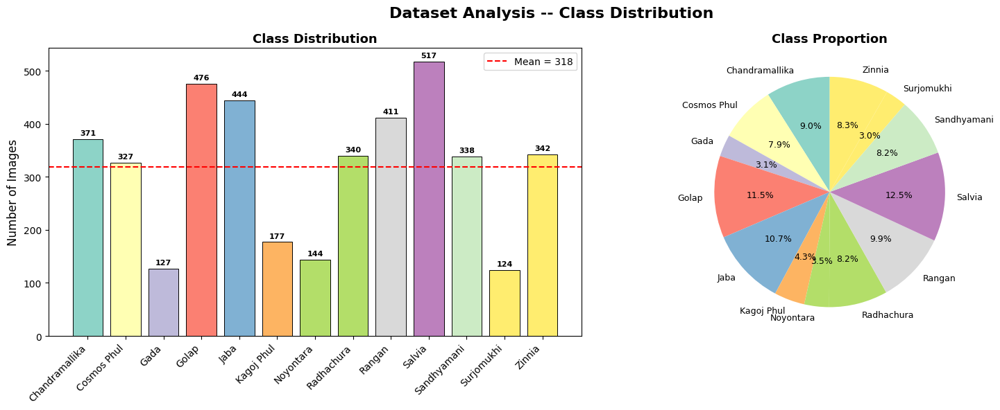

Min: 124 (Surjomukhi)  Max: 517 (Salvia)
Imbalance Ratio: 4.17x


In [ ]:
# ---- Class Distribution Analysis ----
class_counts = df_all['label'].value_counts().sort_index()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Dataset Analysis -- Class Distribution', fontsize=16, fontweight='bold')

colors = plt.cm.Set3(np.linspace(0, 1, NUM_CLASSES))
bars = axes[0].bar(range(len(class_counts)), class_counts.values, color=colors, edgecolor='black', linewidth=0.7)
axes[0].set_xticks(range(len(class_counts)))
axes[0].set_xticklabels(class_counts.index, rotation=45, ha='right', fontsize=10)
axes[0].set_ylabel('Number of Images', fontsize=12)
axes[0].set_title('Class Distribution', fontsize=13, fontweight='bold')
axes[0].axhline(y=class_counts.mean(), color='red', linestyle='--', label=f'Mean = {class_counts.mean():.0f}')
axes[0].legend(fontsize=10)
for bar, val in zip(bars, class_counts.values):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
                 str(val), ha='center', va='bottom', fontsize=8, fontweight='bold')

axes[1].pie(class_counts.values, labels=class_counts.index, autopct='%1.1f%%',
            colors=colors, startangle=90, textprops={'fontsize': 9})
axes[1].set_title('Class Proportion', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'class_distribution.png', dpi=300, bbox_inches='tight')
plt.show()
print(f'Min: {class_counts.min()} ({class_counts.idxmin()})  Max: {class_counts.max()} ({class_counts.idxmax()})')
print(f'Imbalance Ratio: {class_counts.max()/class_counts.min():.2f}x')

## Phase 3: Data Cleaning (Corrupted & Duplicate Removal)

In [ ]:
# # ---- Step 1: Remove Corrupted Images ----
print('Checking for corrupted images...')
corrupted = []
# for _, row in tqdm(df_all.iterrows(), total=len(df_all)):
#     try:
#         with Image.open(row['path']) as img:
#             img.verify()
#     except Exception:
#         corrupted.append(row['path'])

print(f'Corrupted images found: {len(corrupted)}')
df_clean = df_all[~df_all['path'].isin(corrupted)].reset_index(drop=True)
print(f'Images after corruption removal: {len(df_clean)}')

Checking for corrupted images...
Corrupted images found: 0
Images after corruption removal: 4138


In [ ]:
# ---- Step 2: Duplicate Removal using Perceptual Hash ----
print('Checking for duplicate images using perceptual hashing...')
hash_dict = defaultdict(list)
# for _, row in tqdm(df_clean.iterrows(), total=len(df_clean)):
#     try:
#         with Image.open(row['path']) as img:
#             h = str(imagehash.phash(img))
#             hash_dict[h].append(row['path'])
#     except Exception:
#         pass

duplicates = []
for h, paths in hash_dict.items():
    if len(paths) > 1:
        duplicates.extend(paths[1:])

print(f'Duplicate images found: {len(duplicates)}')
df_clean = df_clean[~df_clean['path'].isin(duplicates)].reset_index(drop=True)

print(f'\nData Cleaning Summary:')
print(f'  Original images:    {len(df_all)}')
print(f'  Corrupted removed:  {len(corrupted)}')
print(f'  Duplicates removed: {len(duplicates)}')
print(f'  Clean images:       {len(df_clean)}')

Checking for duplicate images using perceptual hashing...
Duplicate images found: 0

Data Cleaning Summary:
  Original images:    4138
  Corrupted removed:  0
  Duplicates removed: 0
  Clean images:       4138


## Phase 4: Train / Validation / Test Split (Stratified 60/20/20) & Class-Weight Pre-computation

Even the smallest class (~78 images) still leaves ~47 train / ~16 val / ~16 test images with a 60/20/20 stratified split -- enough for reliable validation and testing.

This phase also pre-computes two sets of per-class weights that the class-imbalance methods in Phase 6 will use:
- **Inverse-frequency weights** (`class_weights`) -- classic cost-sensitive weighting.
- **Class-Balanced weights** (`cb_weights`) -- based on the *Effective Number of Samples* (Cui et al., CVPR 2019), which discounts the diminishing returns of adding more samples to already-large classes.

Train:      2482 images (60.0%)
Validation: 828 images (20.0%)
Test:       828 images (20.0%)

Per-class weights (computed from TRAIN split):
Class                 n_train    InvFreq w   ClassBal w
Chandramallika            223       0.6735       0.6974
Cosmos Phul               196       0.7663       0.7832
Gada                       76       1.9762       1.9046
Golap                     286       0.5251       0.5604
Jaba                      266       0.5646       0.5968
Kagoj Phul                106       1.4169       1.3859
Noyontara                  86       1.7464       1.6915
Radhachura                204       0.7362       0.7554
Rangan                    247       0.6081       0.6369
Salvia                    310       0.4845       0.5230
Sandhyamani               203       0.7399       0.7587
Surjomukhi                 74       2.0296       1.9542
Zinnia                    205       0.7326       0.7520


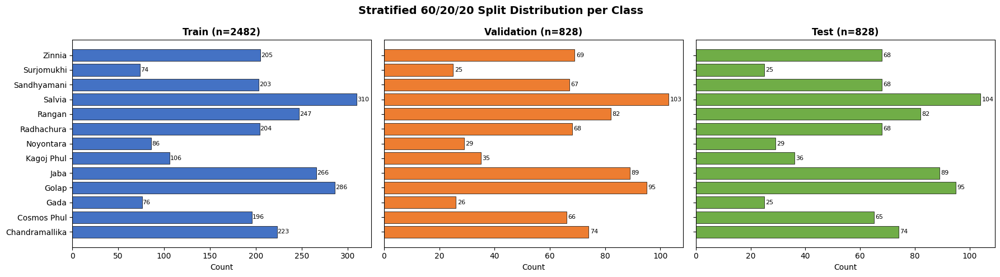

In [ ]:
# Create label encoding
unique_labels = sorted(df_clean['label'].unique())
label2idx = {l: i for i, l in enumerate(unique_labels)}
idx2label = {i: l for l, i in label2idx.items()}
df_clean['label_idx'] = df_clean['label'].map(label2idx)

# Stratified 60/20/20 split
X = df_clean['path'].values
y = df_clean['label_idx'].values

# First: 60% train, 40% temp
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.40, stratify=y, random_state=SEED
)
# Then: split temp 50/50 -> 20% val, 20% test
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.50, stratify=y_temp, random_state=SEED
)

print(f'Train:      {len(X_train)} images ({len(X_train)/len(df_clean)*100:.1f}%)')
print(f'Validation: {len(X_val)} images ({len(X_val)/len(df_clean)*100:.1f}%)')
print(f'Test:       {len(X_test)} images ({len(X_test)/len(df_clean)*100:.1f}%)')

# -- Class weights for imbalanced training (computed from the TRAIN split only) --
train_class_counts = np.bincount(y_train, minlength=len(unique_labels))

# 1) Inverse-frequency weights, rescaled to average to 1.0
inv_freq_np = 1.0 / train_class_counts
inv_freq_np = inv_freq_np / inv_freq_np.sum() * len(unique_labels)
class_weights = torch.FloatTensor(inv_freq_np).to(DEVICE)

# 2) Class-Balanced weights (Effective Number of Samples, beta=0.999)
CB_BETA = 0.999
effective_num = 1.0 - np.power(CB_BETA, train_class_counts)
cb_weights_np = (1.0 - CB_BETA) / effective_num
cb_weights_np = cb_weights_np / cb_weights_np.sum() * len(unique_labels)
cb_weights = torch.FloatTensor(cb_weights_np).to(DEVICE)

print('\nPer-class weights (computed from TRAIN split):')
print(f'{"Class":<20} {"n_train":>8} {"InvFreq w":>12} {"ClassBal w":>12}')
for name, cnt, w1, w2 in zip(unique_labels, train_class_counts, inv_freq_np, cb_weights_np):
    print(f'{name:<20} {cnt:>8d} {w1:>12.4f} {w2:>12.4f}')

# Visualize split distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
splits = [('Train', y_train), ('Validation', y_val), ('Test', y_test)]
colors_split = ['#4472C4', '#ED7D31', '#70AD47']

for ax, (split_name, labels), color in zip(axes, splits, colors_split):
    counts = Counter(labels)
    names = [idx2label[i] for i in sorted(counts.keys())]
    values = [counts[i] for i in sorted(counts.keys())]
    ax.barh(names, values, color=color, edgecolor='black', linewidth=0.5)
    ax.set_title(f'{split_name} (n={len(labels)})', fontweight='bold', fontsize=12)
    ax.set_xlabel('Count')
    for i, v in enumerate(values):
        ax.text(v + 0.5, i, str(v), va='center', fontsize=8)

plt.suptitle('Stratified 60/20/20 Split Distribution per Class', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'split_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

## Phase 5: Preprocessing & Augmentation

Preprocessing is simply Resize -> Normalize.

The augmentation pipeline is restricted to exactly the 8 techniques below, applied only to the **training** split on top of the resized image:

| # | Technique | Detail |
|---|-----------|--------|
| 1 | Horizontal Flip | mirror left-right |
| 2 | Vertical Flip | mirror top-bottom |
| 3 | Rotation 90 deg | rotate clockwise 90 deg |
| 4 | Rotation -90 deg | rotate counter-clockwise 90 deg |
| 5 | Brightness 30% Decreased | multiply pixel values by 0.70 |
| 6 | Brightness 30% Increased | multiply pixel values by 1.30 |
| 7 | 3 Pixel Blur | Gaussian blur, radius = 3 px |
| 8 | 2.5% Pixel Noise | Gaussian noise, std = 2.5% of the 0-255 range |

- Training transform: Resize -> augmentation -> Normalize
- Validation/Test transform: Resize -> Normalize (no augmentation)

In [ ]:
# -- Augmentation transforms: ONLY the 8 techniques below ------------
class BrightnessAdjust:
    """Multiplies pixel brightness by a fixed factor (0.70 = -30%, 1.30 = +30%)."""
    def __init__(self, factor: float):
        self.factor = factor
    def __call__(self, img):
        return ImageEnhance.Brightness(img).enhance(self.factor)


class PixelBlur:
    """Gaussian blur with a fixed pixel radius (default 3 px)."""
    def __init__(self, radius: int = 3):
        self.radius = radius
    def __call__(self, img):
        return img.filter(ImageFilter.GaussianBlur(radius=self.radius))


class PixelNoise:
    """Adds Gaussian noise whose std is a percentage of the 0-255 pixel range."""
    def __init__(self, pct: float = 2.5):
        self.pct = pct
    def __call__(self, img):
        arr = np.array(img).astype(np.float32)
        std = 255.0 * (self.pct / 100.0)
        noisy = arr + np.random.normal(0, std, arr.shape)
        return Image.fromarray(np.clip(noisy, 0, 255).astype(np.uint8))


class Rotate90:
    """Rotates by a fixed +90 or -90 degrees (no interpolation artifacts)."""
    def __init__(self, degrees: int):
        assert degrees in (90, -90)
        self.degrees = degrees
    def __call__(self, img):
        return img.rotate(self.degrees, expand=True).resize(img.size)


AUG_P_FLIP       = 0.5   # Horizontal / Vertical flip
AUG_P_ROTATE     = 0.3   # Rotation +90 / -90 (one or the other)
AUG_P_BRIGHTNESS = 0.3   # Brightness -30% / +30% (one or the other)
AUG_P_BLUR       = 0.15  # 3px blur
AUG_P_NOISE      = 0.15  # 2.5% pixel noise

def build_augmentation_ops():
    """Returns the list of the 8 allowed augmentation ops, applied independently."""
    return [
        transforms.RandomHorizontalFlip(p=AUG_P_FLIP),
        transforms.RandomVerticalFlip(p=AUG_P_FLIP),
        transforms.RandomApply([
            transforms.RandomChoice([Rotate90(90), Rotate90(-90)])
        ], p=AUG_P_ROTATE),
        transforms.RandomApply([
            transforms.RandomChoice([BrightnessAdjust(0.70), BrightnessAdjust(1.30)])
        ], p=AUG_P_BRIGHTNESS),
        transforms.RandomApply([PixelBlur(radius=3)], p=AUG_P_BLUR),
        transforms.RandomApply([PixelNoise(pct=2.5)], p=AUG_P_NOISE),
    ]


def build_train_transform(with_augmentation: bool = True):
    """Single source of truth for the TRAIN transform (no CLAHE)."""
    ops = [transforms.Resize((IMG_SIZE, IMG_SIZE))]
    if with_augmentation:
        ops += build_augmentation_ops()
    ops += [transforms.ToTensor(), transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)]
    return transforms.Compose(ops)


def build_eval_transform():
    """Single source of truth for the VALIDATION/TEST transform (no augmentation, no CLAHE)."""
    ops = [transforms.Resize((IMG_SIZE, IMG_SIZE))]
    ops += [transforms.ToTensor(), transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)]
    return transforms.Compose(ops)


# The ONE training transform and ONE eval transform used throughout this notebook.
train_transform = build_train_transform(with_augmentation=True)
eval_transform  = build_eval_transform()

print('train_transform and eval_transform built (no CLAHE).')
print(train_transform)

train_transform and eval_transform built (no CLAHE).
Compose(
    Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomVerticalFlip(p=0.5)
    RandomApply(
    p=0.3
    RandomChoice(
)(p=None)
)
    RandomApply(
    p=0.3
    RandomChoice(
)(p=None)
)
    RandomApply(
    p=0.15
)
    RandomApply(
    p=0.15
)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


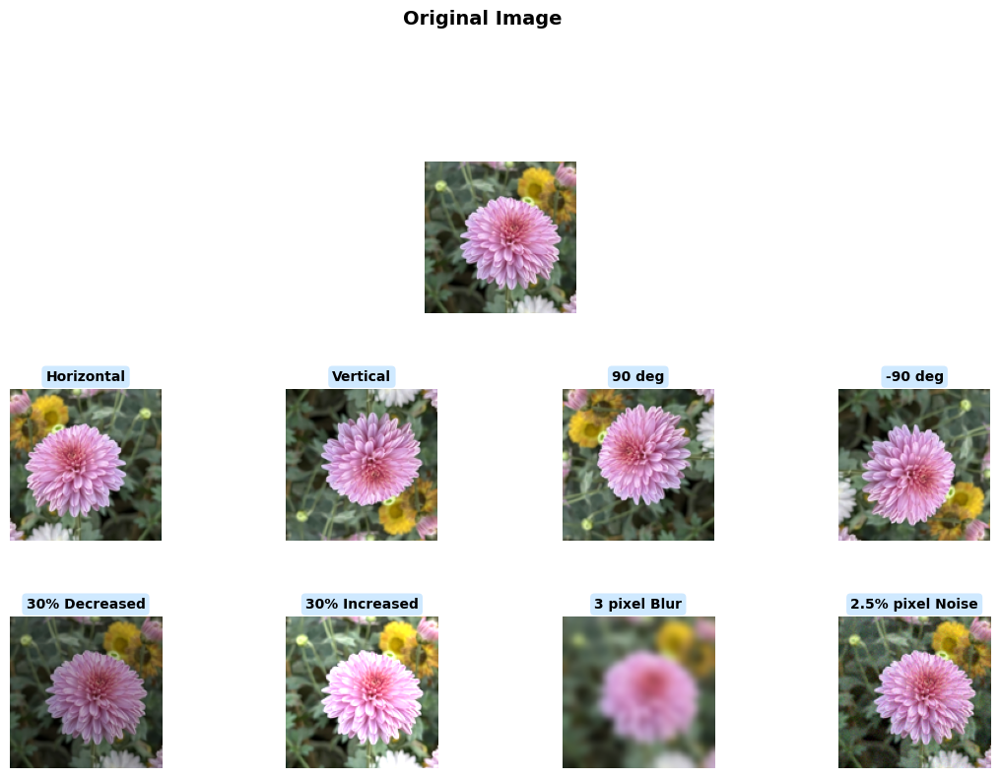

In [ ]:
# ---- Visualize the 8 Allowed Augmentation Techniques ----
demo_path = df_clean.iloc[0]['path']
demo_img = Image.open(demo_path).convert('RGB').resize((IMG_SIZE, IMG_SIZE))

flip_h   = transforms.functional.hflip(demo_img)
flip_v   = transforms.functional.vflip(demo_img)
rot_90   = Rotate90(90)(demo_img)
rot_n90  = Rotate90(-90)(demo_img)
bright_d = BrightnessAdjust(0.70)(demo_img)
bright_i = BrightnessAdjust(1.30)(demo_img)
blur_3   = PixelBlur(radius=3)(demo_img)
noise_25 = PixelNoise(pct=2.5)(demo_img)

fig = plt.figure(figsize=(14, 14))
fig.suptitle('Original Image', fontsize=14, fontweight='bold', y=0.99)
gs = gridspec.GridSpec(5, 4, figure=fig, hspace=0.5, wspace=0.15)

ax0 = fig.add_subplot(gs[0, 1:3])
ax0.imshow(demo_img); ax0.axis('off')

def show(ax, img, label):
    ax.imshow(img); ax.axis('off')
    ax.set_title(label, fontsize=10, fontweight='bold',
                 bbox=dict(boxstyle='round', facecolor='#cfe9ff', edgecolor='none'))

show(fig.add_subplot(gs[1, 0]), flip_h, 'Horizontal')
show(fig.add_subplot(gs[1, 1]), flip_v, 'Vertical')
show(fig.add_subplot(gs[1, 2]), rot_90, '90 deg')
show(fig.add_subplot(gs[1, 3]), rot_n90, '-90 deg')

show(fig.add_subplot(gs[2, 0]), bright_d, '30% Decreased')
show(fig.add_subplot(gs[2, 1]), bright_i, '30% Increased')
show(fig.add_subplot(gs[2, 2]), blur_3, '3 pixel Blur')
show(fig.add_subplot(gs[2, 3]), noise_25, '2.5% pixel Noise')

plt.savefig(OUT_DIR / 'figures' / 'augmentation_demo.png', dpi=300, bbox_inches='tight')
plt.show()

## Phase 6: Class-Imbalance Handling -- Data-Level Methods

Two **data-level** techniques are implemented, both operating on the training split only:

1. **Weighted Random Sampler** -- each epoch, mini-batches are drawn so that every class is sampled roughly equally often (samples are drawn with probability inversely proportional to their class frequency, with replacement).
2. **Offline Oversampling** -- minority-class training images are duplicated (with replacement) until every class matches the largest class's count. Because these duplicated entries still pass through the random augmentation pipeline each time they're loaded, repeated copies are not pixel-identical -- this is the standard image-domain substitute for SMOTE (true SMOTE interpolates in feature space, which doesn't translate directly to raw pixels).

In [ ]:
def build_weighted_sampler(y_train_arr):
    """Per-sample weight = 1 / class_count, used with replacement so minority
    classes are seen roughly as often as the majority class each epoch."""
    class_sample_count = np.bincount(y_train_arr)
    weight_per_class = 1.0 / class_sample_count
    sample_weights = weight_per_class[y_train_arr]
    sample_weights = torch.DoubleTensor(sample_weights)
    return WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)


def build_offline_oversampled_arrays(X_train_arr, y_train_arr, seed=SEED):
    """Duplicates minority-class samples (with replacement) until every class
    matches the majority class's count. Returns new, balanced (X, y) arrays."""
    rng = np.random.default_rng(seed)
    classes, counts = np.unique(y_train_arr, return_counts=True)
    target = counts.max()

    X_bal, y_bal = [], []
    for c in classes:
        idx = np.where(y_train_arr == c)[0]
        if len(idx) < target:
            extra = rng.choice(idx, size=target - len(idx), replace=True)
            idx_full = np.concatenate([idx, extra])
        else:
            idx_full = idx
        X_bal.append(X_train_arr[idx_full])
        y_bal.append(y_train_arr[idx_full])

    X_bal = np.concatenate(X_bal)
    y_bal = np.concatenate(y_bal)
    perm = rng.permutation(len(X_bal))
    return X_bal[perm], y_bal[perm]


# Quick preview of what offline oversampling would produce
_X_os_preview, _y_os_preview = build_offline_oversampled_arrays(X_train, y_train)
print(f'Offline oversampling: {len(X_train)} -> {len(_X_os_preview)} training images '
      f'(every class balanced to {np.bincount(_y_os_preview).max()})')
del _X_os_preview, _y_os_preview

Offline oversampling: 2482 -> 4030 training images (every class balanced to 310)


## Phase 6b: Class-Imbalance Handling -- Algorithm-Level Methods

Two **algorithm-level** (loss-function) techniques are implemented, on top of the class weights already computed in Phase 4:

1. **Class-Weighted Cross-Entropy** -- `nn.CrossEntropyLoss(weight=inverse_frequency_weights)`, standard cost-sensitive learning.
2. **Focal Loss** -- down-weights easy/majority-class examples and focuses training on hard/minority examples via a `(1 - p_t)^gamma` modulating factor, optionally combined with class weights as `alpha`.
3. **Class-Balanced Loss** -- Cross-Entropy weighted by the Effective-Number-of-Samples weights (`cb_weights`) from Phase 4, which handle overlapping/redundant information between samples of large classes more gracefully than naive inverse frequency.

In [ ]:
class FocalLoss(nn.Module):
    """Multi-class Focal Loss (Lin et al., 2017).
    alpha : optional per-class weight tensor (e.g. inverse-frequency weights).
    gamma : focusing parameter; higher gamma down-weights easy examples more.
    """
    def __init__(self, alpha=None, gamma: float = 2.0, reduction: str = 'mean'):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, weight=self.alpha, reduction='none')
        pt = torch.exp(-ce_loss)
        focal_term = (1.0 - pt) ** self.gamma
        loss = focal_term * ce_loss
        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        return loss


print('FocalLoss defined. Class-Weighted CE and Class-Balanced CE simply reuse '
      'nn.CrossEntropyLoss(weight=...) with the class_weights / cb_weights tensors from Phase 4.')

FocalLoss defined. Class-Weighted CE and Class-Balanced CE simply reuse nn.CrossEntropyLoss(weight=...) with the class_weights / cb_weights tensors from Phase 4.


## Phase 6c: Dataset, DataLoaders & the Imbalance-Method Registry

`IMBALANCE_METHODS` is the single registry describing all 7 configurations that will be trained and compared in Phase 9. Each entry specifies:
- whether to use the **weighted sampler** (data-level),
- whether to use **offline oversampling** (data-level),
- which **loss function** to use and which **class-weight tensor** (if any) feeds it (algorithm-level).

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, paths, labels, transform=None):
        self.paths = paths; self.labels = labels; self.transform = transform
    def __len__(self): return len(self.paths)
    def __getitem__(self, idx):
        try:
            img = Image.open(self.paths[idx]).convert('RGB')
        except Exception:
            img = Image.new('RGB', (IMG_SIZE, IMG_SIZE), (128, 128, 128))
        if self.transform: img = self.transform(img)
        return img, self.labels[idx]


# Validation & test loaders never change across imbalance-handling methods --
# only the TRAINING loader/loss changes.
val_loader = DataLoader(
    ImageDataset(X_val, y_val, eval_transform),
    batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader = DataLoader(
    ImageDataset(X_test, y_test, eval_transform),
    batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

print(f'Val batches: {len(val_loader)} | Test batches: {len(test_loader)}')


# ============================================================
# IMBALANCE-METHOD REGISTRY
# ============================================================
IMBALANCE_METHODS = {
    'OfflineOversampling': dict(
        sampler=False, offline_oversample=True, loss='ce', alpha=None, gamma=None,
        description='Data-level: minority-class images duplicated (+augmentation) to match the majority class.'),
    # 'FocalLoss': dict(
    #     sampler=False, offline_oversample=False, loss='focal', alpha='inverse_freq', gamma=2.0,
    #     description='Algorithm-level: focuses loss on hard/minority examples (gamma=2.0).'),
    # 'ClassBalancedLoss': dict(
    #     sampler=False, offline_oversample=False, loss='ce', alpha='class_balanced', gamma=None,
    #     description='Algorithm-level: CE weighted by Effective-Number-of-Samples (beta=0.999).'),
    # 'Sampler_plus_FocalLoss': dict(
    #     sampler=True, offline_oversample=False, loss='focal', alpha='inverse_freq', gamma=2.0,
    #     description='Hybrid: WeightedRandomSampler + Focal Loss together.'),
    # 'ClassWeightedCE': dict(
    #     sampler=False, offline_oversample=False, loss='ce', alpha='inverse_freq', gamma=None,
    #     description='CE loss weighted by inverse class frequency.'),
    # 'WeightedRandomSampler': dict(
    #     sampler=True, offline_oversample=False, loss='ce', alpha=None, gamma=None,
    #     description='Data-level: minority classes oversampled each batch via WeightedRandomSampler.'),
    #  'Baseline_NoHandling': dict(
    #     sampler=False, offline_oversample=False, loss='ce', alpha=None, gamma=None,
    #     description='Plain CE loss, uniform shuffling -- no imbalance handling (control).'),
}


def get_alpha_tensor(alpha_key):
    if alpha_key == 'inverse_freq':
        return class_weights
    elif alpha_key == 'class_balanced':
        return cb_weights
    return None


def build_criterion(cfg):
    alpha_tensor = get_alpha_tensor(cfg['alpha'])
    if cfg['loss'] == 'ce':
        return nn.CrossEntropyLoss(weight=alpha_tensor, label_smoothing=0.1)
    elif cfg['loss'] == 'focal':
        return FocalLoss(alpha=alpha_tensor, gamma=cfg['gamma'])
    raise ValueError(f'Unknown loss type: {cfg["loss"]}')


def build_train_loader_for_method(cfg, X_train_arr, y_train_arr, transform):
    if cfg['offline_oversample']:
        Xb, yb = build_offline_oversampled_arrays(X_train_arr, y_train_arr)
        ds = ImageDataset(Xb, yb, transform)
        return DataLoader(
            ds,
            batch_size=BATCH_SIZE,
            shuffle=True,
            num_workers=NUM_WORKERS,
            pin_memory=True,
            drop_last=True  # Drops incomplete final batch
        )

    ds = ImageDataset(X_train_arr, y_train_arr, transform)
    if cfg['sampler']:
        sampler = build_weighted_sampler(y_train_arr)
        return DataLoader(
            ds,
            batch_size=BATCH_SIZE,
            sampler=sampler,
            num_workers=NUM_WORKERS,
            pin_memory=True,
            drop_last=True  # Drops incomplete final batch
        )

    return DataLoader(
        ds,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=True,
        drop_last=True  # Drops incomplete final batch
    )


print(f'\n{len(IMBALANCE_METHODS)} imbalance-handling methods registered:')
for name, cfg in IMBALANCE_METHODS.items():
    print(f'  - {name:<24}: {cfg["description"]}')

Val batches: 13 | Test batches: 13

1 imbalance-handling methods registered:
  - OfflineOversampling     : Data-level: minority-class images duplicated (+augmentation) to match the majority class.


## Phase 7: Model Definitions (Proposed FlowerGraphCNN, ResNet50, InceptionV3, EfficientNet-B0, MobilenetV2)

In [ ]:
import os
import hashlib
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from skimage.segmentation import slic
from skimage.color import rgb2lab
from scipy import ndimage as ndi
from concurrent.futures import ProcessPoolExecutor




def _pool_worker_init():
    os.environ["OMP_NUM_THREADS"] = "1"
    os.environ["OPENBLAS_NUM_THREADS"] = "1"
    os.environ["MKL_NUM_THREADS"] = "1"


def _extract_graph_worker(img_np, n_segments, compactness, k_neighbors):
    """UNCHANGED from your version -- pure-NumPy graph extraction for ONE image."""
    img_lab = rgb2lab(img_np)
    H, W, _ = img_np.shape
    labels = slic(img_np, n_segments=n_segments, compactness=compactness,
                  start_label=0, channel_axis=-1)
    unique_labels = np.unique(labels)
    num_nodes = len(unique_labels)

    pixels_rgb_all = img_np.astype(np.float64) / 255.0

    mean_rgb = np.stack([ndi.mean(pixels_rgb_all[..., c], labels=labels, index=unique_labels) for c in range(3)], axis=1)
    std_rgb  = np.stack([ndi.standard_deviation(pixels_rgb_all[..., c], labels=labels, index=unique_labels) for c in range(3)], axis=1)
    mean_lab = np.stack([ndi.mean(img_lab[..., c], labels=labels, index=unique_labels) for c in range(3)], axis=1)
    std_lab  = np.stack([ndi.standard_deviation(img_lab[..., c], labels=labels, index=unique_labels) for c in range(3)], axis=1)

    flat_labels = labels.ravel()
    order = np.argsort(flat_labels, kind='stable')
    sorted_labels = flat_labels[order]
    starts = np.searchsorted(sorted_labels, unique_labels, side='left')
    ends   = np.searchsorted(sorted_labels, unique_labels, side='right')
    flat_rgb = pixels_rgb_all.reshape(-1, 3)[order]
    q10_rgb = np.zeros((num_nodes, 3)); q90_rgb = np.zeros((num_nodes, 3))
    for i in range(num_nodes):
        seg = flat_rgb[starts[i]:ends[i]]
        q10_rgb[i] = np.percentile(seg, 10, axis=0)
        q90_rgb[i] = np.percentile(seg, 90, axis=0)

    area = ndi.sum(np.ones((H, W)), labels=labels, index=unique_labels)
    centers = np.array(ndi.center_of_mass(np.ones((H, W)), labels=labels, index=unique_labels))
    cy, cx = centers[:, 0] / float(H), centers[:, 1] / float(W)
    area_ratio = area / float(H * W)

    objs = ndi.find_objects(labels + 1)
    aspect_ratio = np.ones(num_nodes)
    for i, l in enumerate(unique_labels):
        sl = objs[int(l)]
        if sl is not None:
            h_ext, w_ext = sl[0].stop - sl[0].start, sl[1].stop - sl[1].start
            aspect_ratio[i] = h_ext / float(w_ext) if w_ext > 0 else 1.0

    node_features = np.concatenate(
        [mean_rgb, std_rgb, mean_lab, std_lab, q10_rgb, q90_rgb,
         cx[:, None], cy[:, None], area_ratio[:, None], aspect_ratio[:, None]],
        axis=1).astype(np.float32)

    diff = node_features[:, None, :] - node_features[None, :, :]
    dist = np.linalg.norm(diff, axis=-1)
    adj = np.zeros((num_nodes, num_nodes), dtype=np.float32)
    std_dist = dist.std() + 1e-5
    for i in range(num_nodes):
        k = min(k_neighbors, max(1, num_nodes - 1))
        nn_idx = np.argsort(dist[i])[1:k + 1]
        sims = np.exp(-((dist[i, nn_idx] / (2.0 * std_dist ** 2)) ** 2))
        adj[i, nn_idx] = sims
        adj[nn_idx, i] = sims

    adj_tilde = adj + np.eye(num_nodes, dtype=np.float32)
    deg = adj_tilde.sum(axis=1)
    deg_inv_sqrt = np.zeros_like(deg)
    nz = deg > 0
    deg_inv_sqrt[nz] = np.power(deg[nz], -0.5)
    D_mat = np.diag(deg_inv_sqrt)
    adj_norm = D_mat @ adj_tilde @ D_mat

    return node_features, adj_norm


def _extract_graph_chunk(imgs_np_list, n_segments, compactness, k_neighbors):
    """NEW: one worker call handles a WHOLE chunk of images, instead of one
    pool.submit() per image. Cuts IPC round-trips from batch_size to n_workers."""
    return [_extract_graph_worker(img, n_segments, compactness, k_neighbors)
            for img in imgs_np_list]


_GRAPH_POOL = None
_GRAPH_POOL_WORKERS = None


def _get_graph_pool(n_workers: int = None):
    """NEW: right-sizes the pool from the REAL core count instead of a
    hardcoded 4, and prints what it picked so you can sanity-check it
    against your actual Colab runtime."""
    global _GRAPH_POOL, _GRAPH_POOL_WORKERS
    if _GRAPH_POOL is None:
        cpu_total = os.cpu_count() or 2
        n_workers = n_workers or max(1, cpu_total - 1)  # leave 1 core for the main process
        _GRAPH_POOL_WORKERS = n_workers
        _GRAPH_POOL = ProcessPoolExecutor(max_workers=n_workers, initializer=_pool_worker_init)
        print(f'[GraphCNN] os.cpu_count()={cpu_total} -> graph-extraction pool started with '
              f'{n_workers} worker process(es). If cpu_total is small (2-4, common on free '
              f'Colab), also try lowering NUM_WORKERS in Phase 1 -- ImageDataset.__getitem__ '
              f'is cheap for GraphCNN (just PIL decode+augment), so the DataLoader workers '
              f'barely need dedicated cores; freeing them up gives this pool more room.')
    return _GRAPH_POOL


# ---- NEW: exact-reuse cache for deterministic (eval-mode) passes ----------
_GRAPH_CACHE = {}
_GRAPH_CACHE_HITS = 0
_GRAPH_CACHE_MISSES = 0


def _hash_image(img_np: np.ndarray) -> bytes:
    return hashlib.blake2b(img_np.tobytes(), digest_size=16).digest()


def graph_cache_stats():
    total = _GRAPH_CACHE_HITS + _GRAPH_CACHE_MISSES
    hit_rate = 100.0 * _GRAPH_CACHE_HITS / total if total else 0.0
    print(f'[GraphCNN cache] {len(_GRAPH_CACHE)} unique graphs cached | '
          f'{_GRAPH_CACHE_HITS} hits / {_GRAPH_CACHE_MISSES} misses ({hit_rate:.1f}% hit rate)')


def clear_graph_cache():
    global _GRAPH_CACHE_HITS, _GRAPH_CACHE_MISSES
    _GRAPH_CACHE.clear()
    _GRAPH_CACHE_HITS = _GRAPH_CACHE_MISSES = 0


class FastGraphAttentionLayer(nn.Module):
    """UNCHANGED -- AMP-safe memory-efficient GATv2 layer."""

    def __init__(self, in_features: int, out_features: int, alpha: float = 0.2):
        super().__init__()
        self.W = nn.Linear(in_features, out_features, bias=False)
        self.a_left = nn.Linear(out_features, 1, bias=False)
        self.a_right = nn.Linear(out_features, 1, bias=False)
        self.leakyrelu = nn.LeakyReLU(alpha)

        nn.init.xavier_uniform_(self.W.weight)
        nn.init.xavier_uniform_(self.a_left.weight)
        nn.init.xavier_uniform_(self.a_right.weight)

    def forward(self, x: torch.Tensor, adj: torch.Tensor) -> torch.Tensor:
        h = self.W(x)
        e_left = self.a_left(h)
        e_right = self.a_right(h)
        e = self.leakyrelu(e_left + e_right.T)

        zero_vec = -9e15 * torch.ones_like(e)
        attention = torch.where(adj > 0, e, zero_vec)
        attention = F.softmax(attention, dim=-1).to(h.dtype)

        return torch.matmul(attention, h)


class DropInGraphCNN(nn.Module):
    """GAT architecture compatible with standard CNN DataLoaders emitting
    (B, C, H, W) image tensors. Same layers/math as your original version --
    only the graph-extraction plumbing (pool sizing, batching, caching) and
    the final pooling (vectorized instead of Python for-loops) changed.
    """

    def __init__(
        self,
        num_classes: int,
        in_features: int = 22,
        hidden_dim: int = 256,
        n_segments: int = 70,
        compactness: float = 12.0,
        k_neighbors: int = 8,
        mean: tuple = (0.485, 0.456, 0.406),
        std: tuple = (0.229, 0.224, 0.225),
        pool_workers: int = None,   # None = auto-size from os.cpu_count()
    ):
        super().__init__()
        self.n_segments = n_segments
        self.compactness = compactness
        self.k_neighbors = k_neighbors
        self.pool_workers = pool_workers

        self.register_buffer("mean", torch.tensor(mean).view(1, 3, 1, 1))
        self.register_buffer("std", torch.tensor(std).view(1, 3, 1, 1))

        self.input_proj = nn.Linear(in_features, hidden_dim)

        self.gat1 = FastGraphAttentionLayer(hidden_dim, hidden_dim)
        self.norm1 = nn.LayerNorm(hidden_dim)

        self.gat2 = FastGraphAttentionLayer(hidden_dim, hidden_dim)
        self.norm2 = nn.LayerNorm(hidden_dim)

        self.gat3 = FastGraphAttentionLayer(hidden_dim, hidden_dim)
        self.norm3 = nn.LayerNorm(hidden_dim)

        self.attn_mlp = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim // 2),
            nn.Tanh(),
            nn.Linear(hidden_dim // 2, 1),
        )

        self.classifier = nn.Sequential(
            nn.Dropout(p=0.2),
            nn.Linear(hidden_dim * 2, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.1),
            nn.Linear(512, num_classes),
        )

    def _extract_batch(self, imgs_np, use_cache: bool):
        """Returns a list of (node_features, adj_norm), one per image, using
        the cache when safe (eval mode) and the chunked parallel pool for
        whatever isn't cached."""
        global _GRAPH_CACHE_HITS, _GRAPH_CACHE_MISSES
        batch_size = len(imgs_np)
        results = [None] * batch_size

        if use_cache:
            keys = [_hash_image(imgs_np[i]) for i in range(batch_size)]
            miss_idx = []
            for i, k in enumerate(keys):
                cached = _GRAPH_CACHE.get(k)
                if cached is not None:
                    results[i] = cached
                else:
                    miss_idx.append(i)
            _GRAPH_CACHE_HITS += batch_size - len(miss_idx)
            _GRAPH_CACHE_MISSES += len(miss_idx)
        else:
            keys = None
            miss_idx = list(range(batch_size))

        if miss_idx:
            pool = _get_graph_pool(self.pool_workers)
            n_workers = _GRAPH_POOL_WORKERS or 1
            chunks = [c for c in np.array_split(miss_idx, min(n_workers, len(miss_idx))) if len(c)]
            futures = [
                pool.submit(_extract_graph_chunk, [imgs_np[i] for i in chunk],
                            self.n_segments, self.compactness, self.k_neighbors)
                for chunk in chunks
            ]
            for chunk, fut in zip(chunks, futures):
                for idx, result in zip(chunk, fut.result()):
                    results[idx] = result
                    if use_cache:
                        _GRAPH_CACHE[keys[idx]] = result

        return results

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        batch_size = x.size(0)

        img_unnorm = torch.clamp(x * self.std + self.mean, 0.0, 1.0)
        imgs_np = (img_unnorm.detach().permute(0, 2, 3, 1).cpu().numpy() * 255.0).astype(np.uint8)

        # Only cache in eval mode -- val/test are deterministic (safe + valuable
        # to cache), train is freshly augmented every call (would never hit,
        # so skip the bookkeeping and the unbounded memory growth).
        results = self._extract_batch(imgs_np, use_cache=not self.training)

        x_list = [torch.from_numpy(nf).to(x.device) for nf, _ in results]
        adj_list = [torch.from_numpy(a).to(x.device) for _, a in results]

        num_nodes_per_graph = [X.size(0) for X in x_list]
        total_nodes = sum(num_nodes_per_graph)

        X_batch = torch.cat(x_list, dim=0)
        h = F.relu(self.input_proj(X_batch))

        # NEW: torch.block_diag replaces the manual Python loop that built
        # the block-diagonal adjacency one slice-assignment at a time.
        Adj_batch = torch.block_diag(*[a.to(dtype=h.dtype) for a in adj_list])

        # NEW: vectorized batch-index construction (no Python list building).
        batch_index = torch.repeat_interleave(
            torch.arange(batch_size, device=x.device),
            torch.tensor(num_nodes_per_graph, device=x.device),
        )

        # GAT Backbone (unchanged)
        h1 = self.norm1(self.gat1(h, Adj_batch))
        h = F.relu(h1) + h

        h2 = self.norm2(self.gat2(h, Adj_batch))
        h = F.relu(h2) + h

        h3 = self.norm3(self.gat3(h, Adj_batch))
        h = F.relu(h3) + h

        # NEW: vectorized global attention + max pooling. Mathematically
        # identical to the old "for b in range(batch_size): mask = ..." loops
        # (per-graph softmax + per-graph max), just expressed as scatter ops
        # instead of batch_size sequential Python iterations -- removes
        # ~2*batch_size tiny GPU kernel launches per forward pass.
        attn_logits = self.attn_mlp(h).squeeze(-1).float()  # fp32 for AMP-safe softmax, same as gat layers

        seg_max = torch.full((batch_size,), float('-inf'), device=x.device, dtype=torch.float32)
        seg_max.scatter_reduce_(0, batch_index, attn_logits, reduce='amax', include_self=True)
        attn_stable = attn_logits - seg_max[batch_index]
        attn_exp = attn_stable.exp()
        seg_sum = torch.zeros(batch_size, device=x.device, dtype=torch.float32)
        seg_sum.scatter_add_(0, batch_index, attn_exp)
        attn_weights = (attn_exp / seg_sum[batch_index]).unsqueeze(1).to(h.dtype)

        attn_pooled = torch.zeros(batch_size, h.size(1), device=x.device, dtype=h.dtype)
        attn_pooled.index_add_(0, batch_index, attn_weights * h)

        max_pooled = torch.full((batch_size, h.size(1)), float('-inf'), device=x.device, dtype=torch.float32)
        max_pooled.scatter_reduce_(0, batch_index.unsqueeze(1).expand(-1, h.size(1)),
                                    h.float(), reduce='amax', include_self=True)
        max_pooled = max_pooled.to(h.dtype)

        graph_embeddings = torch.cat([attn_pooled, max_pooled], dim=-1)
        return self.classifier(graph_embeddings)


def build_graph_cnn(num_classes: int, pretrained: bool = False) -> nn.Module:
    return DropInGraphCNN(num_classes=num_classes)


In [ ]:
def build_resnet50(num_classes: int, pretrained: bool = False) -> nn.Module:
    """ResNet-50 with custom classification head."""
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2 if pretrained else None)
    in_features = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(p=0.1),
        nn.Linear(512, num_classes)
    )
    return model


def build_inception_v3(num_classes: int, pretrained: bool = False, aux_logits: bool = False) -> nn.Module:
    """Inception-v3 with custom classification head."""
    weights = models.Inception_V3_Weights.IMAGENET1K_V1 if pretrained else None
    model = models.inception_v3(weights=weights, aux_logits=aux_logits)

    in_features = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(p=0.1),
        nn.Linear(512, num_classes)
    )
    return model


def build_efficientnet_b0(num_classes: int, pretrained: bool = False) -> nn.Module:
    """EfficientNet-B0 with custom classification head."""
    model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1 if pretrained else None)
    in_features = model.classifier[1].in_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(p=0.1),
        nn.Linear(512, num_classes)
    )
    return model

def build_mobilenetv2(num_classes: int, pretrained: bool = False) -> nn.Module:
    """MobileNetV2 with custom head consistent with ResNet/DenseNet/EfficientNet."""
    model = models.mobilenet_v2(
        weights=models.MobileNet_V2_Weights.IMAGENET1K_V1 if pretrained else None
    )

    # Access index 1 for the Linear layer (index 0 is Dropout)
    in_features = model.classifier[1].in_features

    # Custom classification head
    model.classifier = nn.Sequential(
        nn.Dropout(p=0.2),
        nn.Linear(in_features, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(p=0.1),
        nn.Linear(512, num_classes)
    )
    return model

def count_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total, trainable


model_configs = {
    'GraphCNN':         build_graph_cnn(NUM_CLASSES),
    'ResNet50':         build_resnet50(NUM_CLASSES),
    'InceptionV3':      build_inception_v3(NUM_CLASSES),
    'EfficientNetB0':   build_efficientnet_b0(NUM_CLASSES),
    'MobilenetV2': build_mobilenetv2(NUM_CLASSES),


     # Added GraphCNN
}

print(f'{"Model":<20} {"Total Params":>15} {"Trainable Params":>18}')
print('-' * 56)
for name, m in model_configs.items():
    total, trainable = count_parameters(m)
    print(f'{name:<20} {total:>15,} {trainable:>18,}')
del model_configs

Model                   Total Params   Trainable Params
--------------------------------------------------------
GraphCNN                     508,942            508,942
ResNet50                  24,564,813         24,564,813
InceptionV3               22,842,349         22,842,349
EfficientNetB0             4,671,113          4,671,113
MobilenetV2                2,887,437          2,887,437


## Phase 8: Training Infrastructure (fixed learning rate -- no scheduler)

Per the requirements, no LR scheduler is implemented; `AdamW` trains at a constant learning rate (`LR`), relying on early stopping to prevent overfitting.

- `train_model()` accepts any `criterion` (CE, class-weighted CE, class-balanced CE, or Focal Loss) and any `train_loader` (plain, sampler-based, or offline-oversampled) -- this is what lets the same training function serve every imbalance-handling method in Phase 9/10.
- `save_to_drive()` is called automatically on every validation-loss improvement.
- `EarlyStopping` tracks `best_epoch`, `best_val_acc`, `best_val_loss`.

In [ ]:
class EarlyStopping:
    def __init__(self, patience=7, min_delta=1e-4, save_path=None):
        self.patience = patience; self.min_delta = min_delta
        self.save_path = save_path; self.counter = 0
        self.best_score = self.best_state = None
        self.best_val_loss = self.best_val_acc = self.best_epoch = None
        self.early_stop = False

    def __call__(self, val_loss, val_acc, epoch, model):
        score = -val_loss
        if self.best_score is None or score > self.best_score + self.min_delta:
            self.best_score = score; self.counter = 0
            self.best_val_loss = val_loss; self.best_val_acc = val_acc
            self.best_epoch = epoch; self._save(model)
        else:
            self.counter += 1
            if self.counter >= self.patience: self.early_stop = True

    def _save(self, model):
        self.best_state = copy.deepcopy(model.state_dict())
        if self.save_path: torch.save(self.best_state, self.save_path)


def train_one_epoch(model, loader, criterion, optimizer, scaler, device):
    model.train()
    total_loss, correct, total = 0.0, 0, 0
    for imgs, labels in tqdm(loader, desc='Train', leave=False):
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        with torch.amp.autocast('cuda'):
            outputs = model(imgs); loss = criterion(outputs, labels)
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        scaler.step(optimizer); scaler.update()
        total_loss += loss.item() * imgs.size(0)
        _, predicted = outputs.max(1)
        correct += predicted.eq(labels).sum().item(); total += imgs.size(0)
    return total_loss / total, 100.0 * correct / total


@torch.no_grad()
def evaluate(model, loader, criterion, device):
    model.eval()
    total_loss, correct, total = 0.0, 0, 0
    all_preds, all_probs, all_labels = [], [], []
    for imgs, labels in tqdm(loader, desc='Eval', leave=False):
        imgs, labels = imgs.to(device), labels.to(device)
        with torch.amp.autocast('cuda'):
            outputs = model(imgs); loss = criterion(outputs, labels)
        probs = F.softmax(outputs, dim=1); _, predicted = outputs.max(1)
        total_loss += loss.item() * imgs.size(0)
        correct += predicted.eq(labels).sum().item(); total += imgs.size(0)
        all_preds.extend(predicted.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
    return (total_loss / total, 100.0 * correct / total,
            np.array(all_preds), np.array(all_probs), np.array(all_labels))


def train_model(model, model_name: str, train_loader, val_loader, device, criterion,
                epochs=NUM_EPOCHS, lr=LR, weight_decay=WEIGHT_DECAY,
                patience=PATIENCE, tag='default'):
    """
    Full training loop at a fixed learning rate (no scheduler).
    criterion    : any loss module built by build_criterion() -- CE, class-weighted CE,
                   class-balanced CE, or Focal Loss.
    train_loader : any loader built by build_train_loader_for_method() -- plain,
                   sampler-based, or offline-oversampled.
    """
    model = model.to(device)
    local_path = OUT_DIR / 'models' / f'{model_name}_{tag}_best.pth'

    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    scaler    = torch.amp.GradScaler('cuda')
    es        = EarlyStopping(patience=patience, save_path=str(local_path))

    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
    prev_best_score = None
    start_time = time.time()

    print(f'\n{"="*65}')
    print(f'  Model: {model_name} | Method: {tag} | Fixed LR: {lr:.1e}')
    print(f'{"="*65}')

    for epoch in range(1, epochs + 1):
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, scaler, device)
        val_loss, val_acc, _, _, _ = evaluate(model, val_loader, criterion, device)

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        print(f'Ep [{epoch:02d}/{epochs}] '
              f'TLoss:{train_loss:.4f} TAcc:{train_acc:.3f}% '
              f'VLoss:{val_loss:.4f} VAcc:{val_acc:.3f}%')

        es(val_loss, val_acc, epoch, model)
        if es.best_score != prev_best_score:
            save_to_drive(model, model_name, tag, epoch, val_acc, val_loss)
            prev_best_score = es.best_score

        if es.early_stop:
            print(f'Early stopping at ep {epoch} (best@ep{es.best_epoch}, val_loss={es.best_val_loss:.4f})')
            break

    print(f'Training time: {(time.time()-start_time)/60:.1f} min')
    model.load_state_dict(es.best_state)
    return model, history


print('Training infrastructure ready.')

Training infrastructure ready.


## Phase 9: Class-Imbalance Handling Method Comparison (3-Fold Cross-Validation)

All 7 methods from the registry are trained on **EfficientNetB0** (chosen as the fast, lightweight comparison backbone) with the shared `train_transform` / `eval_transform`, using **3-fold stratified cross-validation on the training split**. For every fold, the remaining two folds are used for fitting (with each method's sampler/oversampling/loss handling applied) and the held-out fold is used for validation. The 3 folds are built with `StratifiedKFold` and explicitly verified in code to be mutually exclusive -- no fold's held-out validation samples ever appear in another fold's held-out validation set, and together they cover every training sample exactly once. Each fold-trained model is also scored on the fixed, untouched test set for reference. The best method is selected by **mean macro-F1 across the 3 CV validation folds**, and used both for the CNN-architecture comparison and for the full 4-model training run.


In [ ]:
from sklearn.model_selection import StratifiedKFold

# ============================================================
# 3-FOLD STRATIFIED CROSS-VALIDATION SETUP
# ============================================================
N_CV_FOLDS  = 3
CV_EPOCHS   = NUM_EPOCHS   # epochs per fold (kept identical to the rest of the notebook)
CV_PATIENCE = PATIENCE     # early-stopping patience per fold

COMPARISON_BACKBONE = 'SqueezeNet1_1'


def make_stratified_cv_splits(X_arr, y_arr, n_splits=N_CV_FOLDS, seed=SEED):
    """
    Build stratified K-fold CV splits over (X_arr, y_arr).

    sklearn's StratifiedKFold partitions the data into `n_splits` disjoint
    folds (every sample assigned to exactly one fold) and, on each
    iteration, holds out exactly one fold for validation while training on
    the rest. This guarantees the held-out ("test") indices of every fold
    are mutually exclusive of every other fold's held-out indices, and
    that their union covers every sample exactly once -- i.e. no CV
    fold's validation set can ever duplicate another fold's validation set.
    """
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)
    splits = list(skf.split(X_arr, y_arr))

    # ---- Explicit verification that folds are mutually exclusive --------
    val_idx_sets = [set(val_idx.tolist()) for _, val_idx in splits]
    for i in range(len(val_idx_sets)):
        for j in range(i + 1, len(val_idx_sets)):
            overlap = val_idx_sets[i] & val_idx_sets[j]
            assert len(overlap) == 0, (
                f'Fold {i+1} and Fold {j+1} share {len(overlap)} validation '
                f'sample(s) -- CV folds must be mutually exclusive!')
    all_val_idx = set().union(*val_idx_sets)
    assert all_val_idx == set(range(len(X_arr))), \
        'CV folds do not jointly cover every sample exactly once!'
    assert sum(len(s) for s in val_idx_sets) == len(X_arr), \
        'CV fold validation sets overlap -- sizes do not sum to the full dataset!'

    print(f'{n_splits}-fold stratified CV splits verified: all fold validation '
          f'sets are mutually exclusive and jointly cover all {len(X_arr)} '
          f'training samples exactly once (no duplicate validation/test folds).')
    for i, (tr_idx, va_idx) in enumerate(splits, start=1):
        print(f'  Fold {i}: {len(tr_idx)} train / {len(va_idx)} validation samples')
    return splits


def build_cv_val_loader(X_val_arr, y_val_arr):
    """Held-out fold loader -- eval_transform, no shuffle (mirrors val_loader/test_loader)."""
    ds = ImageDataset(X_val_arr, y_val_arr, eval_transform)
    return DataLoader(ds, batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, pin_memory=True)


def compute_fold_metrics(y_true, y_pred):
    return {
        'accuracy': accuracy_score(y_true, y_pred),
        'balanced_accuracy': balanced_accuracy_score(y_true, y_pred),
        'f1': f1_score(y_true, y_pred, average='macro', zero_division=0),
        'precision': precision_score(y_true, y_pred, average='macro', zero_division=0),
        'recall': recall_score(y_true, y_pred, average='macro', zero_division=0),
    }


def aggregate_fold_metrics(metric_dicts):
    """mean/std across a list of per-fold metric dicts -> {key: (mean, std)}"""
    keys = metric_dicts[0].keys()
    return {k: (float(np.mean([m[k] for m in metric_dicts])),
                float(np.std([m[k] for m in metric_dicts]))) for k in keys}


# Folds are built once from the TRAIN split only -- X_val / X_test (Phase 4) stay
# completely untouched and are still used exactly as before everywhere else.
cv_splits = make_stratified_cv_splits(X_train, y_train, n_splits=N_CV_FOLDS, seed=SEED)

imbalance_cv_results = {}  # method_name -> {'fold_val_metrics':[...], 'fold_test_metrics':[...], 'val_agg':{}, 'test_agg':{}}

print(f'\nRunning {N_CV_FOLDS}-fold CV class-imbalance method comparison on '
      f'{COMPARISON_BACKBONE} ({CV_EPOCHS} epochs/fold, {len(IMBALANCE_METHODS)} methods, '
      f'{len(IMBALANCE_METHODS) * N_CV_FOLDS} fold-trainings total)...')




## Phase 9b: CNN Model Architecture Comparison (3-Fold Cross-Validation)

Using the `BEST_IMBALANCE_METHOD` selected above, all 4 CNN backbones (ResNet50, DenseNet121, EfficientNetB0, MobilenetV2) are compared on the **same 3-fold stratified CV split** (`cv_splits`, reused from Phase 9) so every architecture is trained/evaluated on identical folds -- a fair, apples-to-apples comparison. As in Phase 9, each fold's held-out validation set is guaranteed mutually exclusive of the other folds' (verified above), and every fold-trained model is also scored on the fixed, untouched test set for reference.

This comparison is for **evaluation/reporting only**. Phase 10 (unchanged) still fits each architecture once on the full training split to produce the final models used throughout Phases 11-16.


Running 3-fold CV CNN-architecture comparison using imbalance method "OfflineOversampling" (25 epochs/fold, 5 architectures, 15 fold-trainings total)...

Architecture: GraphCNN

--- GraphCNN | Fold 1/3 ---

  Model: GraphCNN | Method: OfflineOversampling_fold1 | Fixed LR: 1.0e-03


Train:   0%|          | 0/42 [00:00<?, ?it/s]

[GraphCNN] os.cpu_count()=4 -> graph-extraction pool started with 3 worker process(es). If cpu_total is small (2-4, common on free Colab), also try lowering NUM_WORKERS in Phase 1 -- ImageDataset.__getitem__ is cheap for GraphCNN (just PIL decode+augment), so the DataLoader workers barely need dedicated cores; freeing them up gives this pool more room.


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:1.8781 TAcc:42.560% VLoss:1.4770 VAcc:61.594%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep01_acc61.59.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.4361 TAcc:62.240% VLoss:1.3185 VAcc:65.821%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep02_acc65.82.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.2689 TAcc:69.531% VLoss:1.1968 VAcc:72.464%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep03_acc72.46.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.1732 TAcc:73.958% VLoss:1.0785 VAcc:77.657%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep04_acc77.66.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.1034 TAcc:77.530% VLoss:1.0706 VAcc:77.657%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep05_acc77.66.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.0657 TAcc:79.092% VLoss:0.9717 VAcc:82.246%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep06_acc82.25.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.0191 TAcc:80.990% VLoss:0.9534 VAcc:84.420%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep07_acc84.42.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:0.9981 TAcc:81.548% VLoss:0.9347 VAcc:85.628%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep08_acc85.63.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:0.9840 TAcc:83.222% VLoss:0.9457 VAcc:83.454%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:0.9541 TAcc:84.635% VLoss:0.8900 VAcc:87.440%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep10_acc87.44.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:0.9257 TAcc:86.272% VLoss:0.8834 VAcc:87.198%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep11_acc87.20.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:0.9022 TAcc:87.500% VLoss:0.8913 VAcc:86.594%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.8890 TAcc:87.723% VLoss:0.8675 VAcc:87.681%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep13_acc87.68.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.8727 TAcc:88.728% VLoss:0.8695 VAcc:88.768%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.8649 TAcc:88.207% VLoss:0.8635 VAcc:88.527%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep15_acc88.53.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.8516 TAcc:89.621% VLoss:0.8455 VAcc:89.855%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep16_acc89.86.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.8457 TAcc:89.472% VLoss:0.8417 VAcc:90.097%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep17_acc90.10.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.8226 TAcc:90.737% VLoss:0.8248 VAcc:89.493%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep18_acc89.49.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8107 TAcc:91.815% VLoss:0.8072 VAcc:91.425%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep19_acc91.43.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8017 TAcc:91.295% VLoss:0.8487 VAcc:88.043%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.7952 TAcc:92.113% VLoss:0.8133 VAcc:89.976%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.7838 TAcc:91.964% VLoss:0.7939 VAcc:92.391%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep22_acc92.39.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.7776 TAcc:92.708% VLoss:0.8027 VAcc:91.063%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.7719 TAcc:92.932% VLoss:0.7787 VAcc:92.391%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep24_acc92.39.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.7617 TAcc:93.229% VLoss:0.7735 VAcc:92.633%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold1_ep25_acc92.63.pth
Training time: 21.9 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 1: CV-Val Acc 92.63% | Fixed-Test Acc 90.46% | Fixed-Test Macro-F1 89.50%

--- GraphCNN | Fold 2/3 ---

  Model: GraphCNN | Method: OfflineOversampling_fold2 | Fixed LR: 1.0e-03


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:1.8822 TAcc:43.178% VLoss:1.5989 VAcc:57.557%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep01_acc57.56.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.3905 TAcc:65.816% VLoss:1.2982 VAcc:67.352%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep02_acc67.35.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.2446 TAcc:70.617% VLoss:1.1628 VAcc:75.212%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep03_acc75.21.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.1645 TAcc:74.352% VLoss:1.0839 VAcc:77.630%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep04_acc77.63.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.1094 TAcc:77.553% VLoss:1.0580 VAcc:78.114%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep05_acc78.11.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.0484 TAcc:80.831% VLoss:1.0460 VAcc:78.597%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep06_acc78.60.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.0333 TAcc:80.793% VLoss:0.9918 VAcc:83.071%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep07_acc83.07.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:0.9999 TAcc:82.279% VLoss:0.9519 VAcc:83.192%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep08_acc83.19.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:0.9757 TAcc:83.422% VLoss:0.9423 VAcc:83.676%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep09_acc83.68.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:0.9430 TAcc:84.947% VLoss:0.9029 VAcc:86.094%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep10_acc86.09.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:0.9323 TAcc:85.861% VLoss:0.8904 VAcc:85.973%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep11_acc85.97.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:0.9117 TAcc:87.233% VLoss:0.8871 VAcc:86.457%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep12_acc86.46.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.8860 TAcc:87.995% VLoss:0.8858 VAcc:86.336%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep13_acc86.34.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.8764 TAcc:88.415% VLoss:0.8721 VAcc:87.787%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep14_acc87.79.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.8708 TAcc:87.881% VLoss:0.8410 VAcc:88.996%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep15_acc89.00.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.8497 TAcc:88.948% VLoss:0.8498 VAcc:88.029%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.8447 TAcc:89.520% VLoss:0.8307 VAcc:89.480%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep17_acc89.48.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.8282 TAcc:89.901% VLoss:0.8260 VAcc:89.843%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep18_acc89.84.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8054 TAcc:91.120% VLoss:0.8198 VAcc:89.359%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep19_acc89.36.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8294 TAcc:90.663% VLoss:0.8170 VAcc:88.634%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep20_acc88.63.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.7994 TAcc:92.111% VLoss:0.8290 VAcc:88.875%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.7958 TAcc:91.730% VLoss:0.8066 VAcc:90.206%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep22_acc90.21.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.7889 TAcc:92.569% VLoss:0.8092 VAcc:89.480%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.7862 TAcc:92.530% VLoss:0.7890 VAcc:91.898%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep24_acc91.90.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.7857 TAcc:92.302% VLoss:0.7733 VAcc:91.898%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold2_ep25_acc91.90.pth
Training time: 21.4 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 2: CV-Val Acc 91.90% | Fixed-Test Acc 89.61% | Fixed-Test Macro-F1 88.35%

--- GraphCNN | Fold 3/3 ---

  Model: GraphCNN | Method: OfflineOversampling_fold3 | Fixed LR: 1.0e-03


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:1.8416 TAcc:45.722% VLoss:1.5735 VAcc:58.283%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep01_acc58.28.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.3942 TAcc:64.397% VLoss:1.3067 VAcc:69.528%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep02_acc69.53.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.2624 TAcc:69.085% VLoss:1.1695 VAcc:74.123%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep03_acc74.12.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.1572 TAcc:75.298% VLoss:1.0938 VAcc:76.300%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep04_acc76.30.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.1064 TAcc:76.228% VLoss:1.0094 VAcc:82.950%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep05_acc82.95.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.0565 TAcc:79.501% VLoss:0.9870 VAcc:83.555%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep06_acc83.56.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.0326 TAcc:80.804% VLoss:0.9915 VAcc:81.862%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:0.9777 TAcc:83.519% VLoss:0.9625 VAcc:83.071%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep08_acc83.07.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:0.9449 TAcc:85.082% VLoss:0.9409 VAcc:85.852%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep09_acc85.85.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:0.9304 TAcc:85.900% VLoss:0.9054 VAcc:87.424%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep10_acc87.42.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:0.9103 TAcc:86.570% VLoss:0.8941 VAcc:87.545%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep11_acc87.55.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:0.8841 TAcc:88.021% VLoss:0.8633 VAcc:88.271%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep12_acc88.27.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.8650 TAcc:89.062% VLoss:0.8496 VAcc:88.634%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep13_acc88.63.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.8564 TAcc:89.472% VLoss:0.8279 VAcc:91.415%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep14_acc91.41.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.8339 TAcc:89.695% VLoss:0.8398 VAcc:90.326%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.8169 TAcc:90.737% VLoss:0.8355 VAcc:89.843%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.8001 TAcc:91.927% VLoss:0.8060 VAcc:91.536%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep17_acc91.54.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.7937 TAcc:91.964% VLoss:0.8144 VAcc:90.810%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8023 TAcc:91.220% VLoss:0.8265 VAcc:89.843%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.7875 TAcc:92.076% VLoss:0.8022 VAcc:90.931%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep20_acc90.93.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.7903 TAcc:92.150% VLoss:0.7981 VAcc:92.019%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep21_acc92.02.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.7723 TAcc:93.304% VLoss:0.7817 VAcc:92.019%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep22_acc92.02.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.7705 TAcc:92.374% VLoss:0.7764 VAcc:92.382%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep23_acc92.38.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.7593 TAcc:94.271% VLoss:0.7674 VAcc:93.712%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_ep24_acc93.71.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.7531 TAcc:94.271% VLoss:0.7934 VAcc:90.810%
Training time: 22.2 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 3: CV-Val Acc 93.71% | Fixed-Test Acc 92.39% | Fixed-Test Macro-F1 91.75%

GraphCNN             | CV-Val Acc: 92.75% (+/-0.74) | Fixed-Test Acc: 90.82% (+/-1.16) | Fixed-Test Macro-F1: 89.87% (+/-1.41)

Architecture: ResNet50

--- ResNet50 | Fold 1/3 ---

  Model: ResNet50 | Method: OfflineOversampling_fold1 | Fixed LR: 1.0e-03


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.2436 TAcc:23.884% VLoss:3.4166 VAcc:21.256%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold1_ep01_acc21.26.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.7872 TAcc:43.118% VLoss:2.1550 VAcc:44.444%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold1_ep02_acc44.44.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.5565 TAcc:54.278% VLoss:1.3383 VAcc:65.821%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold1_ep03_acc65.82.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.3929 TAcc:63.467% VLoss:1.9388 VAcc:54.831%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.2978 TAcc:67.188% VLoss:1.2636 VAcc:70.048%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold1_ep05_acc70.05.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.2067 TAcc:70.722% VLoss:1.3263 VAcc:67.754%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.1827 TAcc:73.735% VLoss:1.3541 VAcc:64.976%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.1198 TAcc:74.888% VLoss:1.3114 VAcc:70.531%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.0863 TAcc:77.158% VLoss:1.1955 VAcc:71.256%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold1_ep09_acc71.26.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:1.0847 TAcc:76.897% VLoss:1.2465 VAcc:72.222%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.0140 TAcc:79.315% VLoss:1.0178 VAcc:78.382%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold1_ep11_acc78.38.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:1.0247 TAcc:80.246% VLoss:1.0446 VAcc:79.348%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.9687 TAcc:81.845% VLoss:1.1128 VAcc:75.121%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.9456 TAcc:83.482% VLoss:1.1146 VAcc:75.121%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.9335 TAcc:83.445% VLoss:1.0045 VAcc:77.657%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold1_ep15_acc77.66.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.9089 TAcc:85.231% VLoss:1.0772 VAcc:77.415%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.8910 TAcc:85.491% VLoss:0.9779 VAcc:81.280%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold1_ep17_acc81.28.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.9139 TAcc:84.561% VLoss:1.0029 VAcc:81.159%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8720 TAcc:87.016% VLoss:0.8697 VAcc:87.077%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold1_ep19_acc87.08.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8742 TAcc:86.198% VLoss:0.8906 VAcc:86.111%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8097 TAcc:89.286% VLoss:0.9016 VAcc:85.749%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.8251 TAcc:89.062% VLoss:0.9627 VAcc:83.696%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.8108 TAcc:90.216% VLoss:0.9153 VAcc:85.386%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.7960 TAcc:89.955% VLoss:0.9559 VAcc:82.971%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.7787 TAcc:90.290% VLoss:0.8788 VAcc:86.715%
Training time: 3.7 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 1: CV-Val Acc 87.08% | Fixed-Test Acc 85.87% | Fixed-Test Macro-F1 84.68%

--- ResNet50 | Fold 2/3 ---

  Model: ResNet50 | Method: OfflineOversampling_fold2 | Fixed LR: 1.0e-03


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.2552 TAcc:23.742% VLoss:7.7064 VAcc:16.929%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold2_ep01_acc16.93.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.8065 TAcc:44.169% VLoss:2.3271 VAcc:40.508%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold2_ep02_acc40.51.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.5360 TAcc:55.259% VLoss:1.7630 VAcc:49.819%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold2_ep03_acc49.82.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.4069 TAcc:62.309% VLoss:1.3928 VAcc:63.724%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold2_ep04_acc63.72.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.3068 TAcc:66.730% VLoss:1.3753 VAcc:65.175%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold2_ep05_acc65.18.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.2208 TAcc:70.770% VLoss:1.2116 VAcc:70.496%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold2_ep06_acc70.50.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.1768 TAcc:71.989% VLoss:1.2218 VAcc:70.496%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.1202 TAcc:74.771% VLoss:1.1670 VAcc:74.002%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold2_ep08_acc74.00.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.1022 TAcc:76.905% VLoss:1.2767 VAcc:71.947%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:1.0663 TAcc:77.096% VLoss:1.4892 VAcc:60.218%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.0665 TAcc:77.287% VLoss:1.0284 VAcc:78.839%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold2_ep11_acc78.84.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:0.9975 TAcc:80.907% VLoss:1.2501 VAcc:71.947%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.9628 TAcc:82.812% VLoss:1.0468 VAcc:78.839%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.9773 TAcc:81.364% VLoss:1.2262 VAcc:72.430%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.9469 TAcc:83.575% VLoss:1.0880 VAcc:76.179%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.9164 TAcc:84.680% VLoss:1.0028 VAcc:80.169%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold2_ep16_acc80.17.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.9218 TAcc:84.032% VLoss:1.0139 VAcc:80.653%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.8890 TAcc:86.585% VLoss:0.9265 VAcc:84.160%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold2_ep18_acc84.16.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8799 TAcc:86.547% VLoss:0.9863 VAcc:80.290%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8390 TAcc:87.691% VLoss:0.9677 VAcc:81.620%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8651 TAcc:86.662% VLoss:0.9135 VAcc:85.732%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold2_ep21_acc85.73.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.8390 TAcc:88.377% VLoss:0.9325 VAcc:84.764%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.8508 TAcc:87.386% VLoss:0.9701 VAcc:82.104%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.8118 TAcc:89.787% VLoss:0.9221 VAcc:84.401%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.8027 TAcc:90.244% VLoss:1.0604 VAcc:75.091%
Training time: 3.7 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 2: CV-Val Acc 85.73% | Fixed-Test Acc 83.82% | Fixed-Test Macro-F1 83.52%

--- ResNet50 | Fold 3/3 ---

  Model: ResNet50 | Method: OfflineOversampling_fold3 | Fixed LR: 1.0e-03


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.1964 TAcc:28.051% VLoss:3.8215 VAcc:16.687%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold3_ep01_acc16.69.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.6625 TAcc:50.670% VLoss:1.6445 VAcc:55.139%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold3_ep02_acc55.14.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.4820 TAcc:58.929% VLoss:1.7057 VAcc:55.502%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.4107 TAcc:61.607% VLoss:1.4036 VAcc:62.636%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold3_ep04_acc62.64.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.2833 TAcc:67.597% VLoss:2.0933 VAcc:57.316%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.2232 TAcc:69.122% VLoss:1.3008 VAcc:66.385%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold3_ep06_acc66.38.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.1541 TAcc:72.098% VLoss:1.3233 VAcc:68.077%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.1282 TAcc:73.586% VLoss:1.2855 VAcc:67.836%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold3_ep08_acc67.84.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.0868 TAcc:75.781% VLoss:1.1874 VAcc:75.453%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold3_ep09_acc75.45.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:1.0504 TAcc:77.567% VLoss:1.0513 VAcc:78.235%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold3_ep10_acc78.23.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.0223 TAcc:78.720% VLoss:1.0779 VAcc:76.421%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:1.0201 TAcc:79.018% VLoss:1.2140 VAcc:72.793%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.9965 TAcc:80.543% VLoss:1.2994 VAcc:66.626%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.9752 TAcc:81.585% VLoss:1.1409 VAcc:75.453%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.9587 TAcc:82.664% VLoss:1.0261 VAcc:79.323%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold3_ep15_acc79.32.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.9265 TAcc:84.412% VLoss:1.0828 VAcc:78.718%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.9233 TAcc:83.817% VLoss:1.3077 VAcc:70.254%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.9176 TAcc:84.412% VLoss:0.9916 VAcc:82.950%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold3_ep18_acc82.95.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8847 TAcc:86.198% VLoss:1.0417 VAcc:81.862%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8517 TAcc:87.760% VLoss:1.2004 VAcc:77.509%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8576 TAcc:87.649% VLoss:0.8973 VAcc:86.820%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold3_ep21_acc86.82.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.8341 TAcc:88.839% VLoss:0.8958 VAcc:85.490%
  -> Checkpoint saved to Drive & Local: ResNet50_OfflineOversampling_fold3_ep22_acc85.49.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.8100 TAcc:89.062% VLoss:1.0505 VAcc:79.565%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.8200 TAcc:89.546% VLoss:1.0438 VAcc:80.411%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.7835 TAcc:91.741% VLoss:0.9444 VAcc:85.248%
Training time: 3.7 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 3: CV-Val Acc 85.49% | Fixed-Test Acc 83.70% | Fixed-Test Macro-F1 82.67%

ResNet50             | CV-Val Acc: 86.10% (+/-0.70) | Fixed-Test Acc: 84.46% (+/-1.00) | Fixed-Test Macro-F1: 83.62% (+/-0.82)

Architecture: InceptionV3

--- InceptionV3 | Fold 1/3 ---

  Model: InceptionV3 | Method: OfflineOversampling_fold1 | Fixed LR: 1.0e-03


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.2647 TAcc:25.930% VLoss:2.6789 VAcc:25.604%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold1_ep01_acc25.60.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.7206 TAcc:48.326% VLoss:2.9262 VAcc:41.908%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.5209 TAcc:57.031% VLoss:1.4168 VAcc:66.304%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold1_ep03_acc66.30.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.3688 TAcc:64.546% VLoss:1.2738 VAcc:66.908%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold1_ep04_acc66.91.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.2961 TAcc:67.932% VLoss:1.3914 VAcc:61.836%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.2097 TAcc:72.582% VLoss:1.1338 VAcc:75.604%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold1_ep06_acc75.60.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.1489 TAcc:75.112% VLoss:1.1867 VAcc:73.309%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.1083 TAcc:76.711% VLoss:1.0981 VAcc:77.415%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold1_ep08_acc77.42.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.0622 TAcc:78.423% VLoss:1.1146 VAcc:75.362%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:1.0566 TAcc:78.906% VLoss:0.9998 VAcc:81.401%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold1_ep10_acc81.40.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.0023 TAcc:81.882% VLoss:1.0837 VAcc:75.966%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:1.0398 TAcc:80.060% VLoss:1.2936 VAcc:68.237%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.9333 TAcc:83.668% VLoss:1.1292 VAcc:76.087%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.9755 TAcc:82.999% VLoss:1.0862 VAcc:78.261%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.9401 TAcc:84.226% VLoss:0.8622 VAcc:86.715%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold1_ep15_acc86.71.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.8917 TAcc:85.751% VLoss:0.9645 VAcc:82.488%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.9429 TAcc:84.375% VLoss:0.9241 VAcc:85.870%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.8983 TAcc:86.458% VLoss:1.0633 VAcc:79.227%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8671 TAcc:87.240% VLoss:1.0287 VAcc:82.971%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8828 TAcc:86.012% VLoss:0.9547 VAcc:82.729%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8352 TAcc:88.616% VLoss:0.9465 VAcc:83.575%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.8380 TAcc:88.207% VLoss:0.9565 VAcc:83.816%
Early stopping at ep 22 (best@ep15, val_loss=0.8622)
Training time: 3.2 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 1: CV-Val Acc 86.71% | Fixed-Test Acc 84.42% | Fixed-Test Macro-F1 84.27%

--- InceptionV3 | Fold 2/3 ---

  Model: InceptionV3 | Method: OfflineOversampling_fold2 | Fixed LR: 1.0e-03


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.2256 TAcc:29.459% VLoss:2.1182 VAcc:36.759%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep01_acc36.76.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.7323 TAcc:48.704% VLoss:1.7656 VAcc:53.083%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep02_acc53.08.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.5400 TAcc:56.593% VLoss:1.7298 VAcc:55.623%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep03_acc55.62.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.3843 TAcc:63.148% VLoss:1.4448 VAcc:59.129%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep04_acc59.13.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.3145 TAcc:66.883% VLoss:1.2440 VAcc:69.891%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep05_acc69.89.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.2313 TAcc:70.236% VLoss:1.2350 VAcc:67.956%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep06_acc67.96.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.1685 TAcc:73.399% VLoss:1.1466 VAcc:74.365%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep07_acc74.37.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.1217 TAcc:76.562% VLoss:1.1046 VAcc:75.695%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep08_acc75.70.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.0775 TAcc:78.468% VLoss:1.1422 VAcc:71.705%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:1.0154 TAcc:80.221% VLoss:1.3011 VAcc:70.012%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.0307 TAcc:80.526% VLoss:1.0772 VAcc:75.937%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep11_acc75.94.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:1.0602 TAcc:79.688% VLoss:1.0560 VAcc:76.421%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep12_acc76.42.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:1.0020 TAcc:80.869% VLoss:1.1644 VAcc:75.574%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.9531 TAcc:83.537% VLoss:0.9416 VAcc:82.950%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep14_acc82.95.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.9256 TAcc:84.909% VLoss:1.1498 VAcc:74.244%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.9182 TAcc:84.794% VLoss:0.9995 VAcc:81.137%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.8749 TAcc:86.585% VLoss:1.0324 VAcc:80.895%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.9143 TAcc:85.709% VLoss:0.9307 VAcc:84.764%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep18_acc84.76.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8777 TAcc:86.738% VLoss:0.8592 VAcc:86.578%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep19_acc86.58.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8404 TAcc:88.415% VLoss:0.9940 VAcc:83.918%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8420 TAcc:88.224% VLoss:1.5337 VAcc:64.813%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.8190 TAcc:89.787% VLoss:1.0328 VAcc:80.774%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.8480 TAcc:88.110% VLoss:0.8507 VAcc:86.336%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep23_acc86.34.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.8396 TAcc:88.224% VLoss:0.8478 VAcc:88.029%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep24_acc88.03.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.8078 TAcc:89.520% VLoss:0.8145 VAcc:88.392%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold2_ep25_acc88.39.pth
Training time: 3.7 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 2: CV-Val Acc 88.39% | Fixed-Test Acc 88.41% | Fixed-Test Macro-F1 87.98%

--- InceptionV3 | Fold 3/3 ---

  Model: InceptionV3 | Method: OfflineOversampling_fold3 | Fixed LR: 1.0e-03


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.2189 TAcc:26.674% VLoss:2.2327 VAcc:34.583%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold3_ep01_acc34.58.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.6507 TAcc:51.228% VLoss:1.7340 VAcc:57.074%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold3_ep02_acc57.07.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.4722 TAcc:60.640% VLoss:1.3442 VAcc:66.385%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold3_ep03_acc66.38.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.3332 TAcc:67.150% VLoss:1.5400 VAcc:63.724%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.2051 TAcc:73.214% VLoss:1.5116 VAcc:62.636%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.2134 TAcc:72.284% VLoss:1.1171 VAcc:75.212%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold3_ep06_acc75.21.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.1083 TAcc:76.823% VLoss:1.3759 VAcc:69.407%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.1181 TAcc:76.116% VLoss:1.1888 VAcc:75.333%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.0556 TAcc:78.162% VLoss:1.0839 VAcc:78.114%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold3_ep09_acc78.11.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:0.9809 TAcc:81.994% VLoss:1.2501 VAcc:72.793%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.0034 TAcc:80.841% VLoss:1.0255 VAcc:81.016%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold3_ep11_acc81.02.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:0.9748 TAcc:82.887% VLoss:1.3075 VAcc:69.891%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.9588 TAcc:83.296% VLoss:1.3547 VAcc:74.123%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.9557 TAcc:83.296% VLoss:1.0978 VAcc:81.378%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.8944 TAcc:85.751% VLoss:1.1973 VAcc:73.881%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.9118 TAcc:84.635% VLoss:1.1165 VAcc:76.663%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.8976 TAcc:86.496% VLoss:1.0931 VAcc:80.653%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.8658 TAcc:86.868% VLoss:0.9363 VAcc:84.643%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold3_ep18_acc84.64.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8423 TAcc:88.430% VLoss:0.9111 VAcc:84.885%
  -> Checkpoint saved to Drive & Local: InceptionV3_OfflineOversampling_fold3_ep19_acc84.89.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8153 TAcc:88.542% VLoss:0.9875 VAcc:82.225%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8505 TAcc:88.058% VLoss:1.0953 VAcc:79.202%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.8307 TAcc:89.062% VLoss:0.9523 VAcc:83.676%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.8275 TAcc:88.876% VLoss:0.9231 VAcc:86.457%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.8039 TAcc:90.030% VLoss:0.9954 VAcc:83.434%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.7955 TAcc:90.141% VLoss:0.9166 VAcc:85.127%
Training time: 3.7 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 3: CV-Val Acc 84.89% | Fixed-Test Acc 82.25% | Fixed-Test Macro-F1 81.44%

InceptionV3          | CV-Val Acc: 86.66% (+/-1.43) | Fixed-Test Acc: 85.02% (+/-2.55) | Fixed-Test Macro-F1: 84.56% (+/-2.68)

Architecture: EfficientNetB0

--- EfficientNetB0 | Fold 1/3 ---

  Model: EfficientNetB0 | Method: OfflineOversampling_fold1 | Fixed LR: 1.0e-03


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.3963 TAcc:17.076% VLoss:2.5905 VAcc:11.594%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep01_acc11.59.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.9953 TAcc:33.445% VLoss:2.1255 VAcc:25.845%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep02_acc25.85.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.7543 TAcc:44.940% VLoss:2.0858 VAcc:45.531%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep03_acc45.53.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.5566 TAcc:53.869% VLoss:1.8537 VAcc:48.068%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep04_acc48.07.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.4246 TAcc:59.301% VLoss:1.3077 VAcc:64.614%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep05_acc64.61.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.3089 TAcc:65.774% VLoss:1.3383 VAcc:64.614%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.2370 TAcc:69.196% VLoss:1.2512 VAcc:69.928%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep07_acc69.93.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.2001 TAcc:71.094% VLoss:1.1689 VAcc:72.585%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep08_acc72.58.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.1328 TAcc:75.595% VLoss:1.2629 VAcc:71.618%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:1.0738 TAcc:77.567% VLoss:1.1515 VAcc:74.155%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep10_acc74.15.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.0493 TAcc:79.836% VLoss:1.0098 VAcc:79.589%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep11_acc79.59.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:0.9863 TAcc:81.622% VLoss:1.0347 VAcc:79.227%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.9897 TAcc:81.548% VLoss:1.0617 VAcc:80.314%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.9416 TAcc:83.408% VLoss:0.9931 VAcc:83.092%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep14_acc83.09.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.9408 TAcc:83.631% VLoss:0.9025 VAcc:85.749%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep15_acc85.75.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.9137 TAcc:85.268% VLoss:0.9581 VAcc:83.696%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.8662 TAcc:87.388% VLoss:0.8446 VAcc:88.043%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep17_acc88.04.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.8600 TAcc:88.021% VLoss:0.8376 VAcc:87.440%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep18_acc87.44.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8387 TAcc:88.021% VLoss:0.9740 VAcc:82.850%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8297 TAcc:89.062% VLoss:0.9244 VAcc:84.662%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.7917 TAcc:90.365% VLoss:0.8415 VAcc:87.681%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.7851 TAcc:90.290% VLoss:0.8904 VAcc:86.232%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.7951 TAcc:90.513% VLoss:0.8104 VAcc:88.527%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold1_ep23_acc88.53.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.7693 TAcc:91.443% VLoss:0.8246 VAcc:89.614%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.7706 TAcc:90.923% VLoss:0.8481 VAcc:88.285%
Training time: 3.9 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 1: CV-Val Acc 88.53% | Fixed-Test Acc 87.20% | Fixed-Test Macro-F1 86.38%

--- EfficientNetB0 | Fold 2/3 ---

  Model: EfficientNetB0 | Method: OfflineOversampling_fold2 | Fixed LR: 1.0e-03


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.3741 TAcc:18.864% VLoss:2.6440 VAcc:3.507%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep01_acc3.51.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.9226 TAcc:36.585% VLoss:1.9656 VAcc:36.276%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep02_acc36.28.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.7077 TAcc:45.427% VLoss:1.7111 VAcc:49.819%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep03_acc49.82.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.5716 TAcc:54.383% VLoss:1.6744 VAcc:48.126%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep04_acc48.13.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.4134 TAcc:62.309% VLoss:1.3792 VAcc:62.273%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep05_acc62.27.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.2844 TAcc:66.883% VLoss:1.2299 VAcc:68.440%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep06_acc68.44.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.2147 TAcc:72.294% VLoss:1.2888 VAcc:66.385%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.1416 TAcc:75.877% VLoss:1.1026 VAcc:75.333%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep08_acc75.33.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.0746 TAcc:77.515% VLoss:1.1011 VAcc:76.179%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep09_acc76.18.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:1.0526 TAcc:79.116% VLoss:1.1605 VAcc:74.486%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.0131 TAcc:81.784% VLoss:1.0004 VAcc:81.862%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep11_acc81.86.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:0.9868 TAcc:81.555% VLoss:0.9484 VAcc:82.588%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep12_acc82.59.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.9674 TAcc:83.460% VLoss:1.0654 VAcc:79.202%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.9338 TAcc:83.918% VLoss:1.0584 VAcc:78.839%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.9398 TAcc:84.718% VLoss:0.9251 VAcc:84.522%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep15_acc84.52.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.9236 TAcc:84.985% VLoss:0.9851 VAcc:81.620%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.8728 TAcc:87.462% VLoss:0.9008 VAcc:85.006%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep17_acc85.01.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.8618 TAcc:87.767% VLoss:0.9338 VAcc:84.401%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8410 TAcc:88.072% VLoss:0.9055 VAcc:85.127%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8159 TAcc:89.139% VLoss:0.8537 VAcc:87.183%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep20_acc87.18.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8352 TAcc:88.605% VLoss:0.7861 VAcc:90.568%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep21_acc90.57.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.8163 TAcc:89.253% VLoss:0.8945 VAcc:86.820%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.8003 TAcc:90.244% VLoss:1.0614 VAcc:79.202%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.7827 TAcc:90.968% VLoss:0.7620 VAcc:91.657%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold2_ep24_acc91.66.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.7767 TAcc:91.044% VLoss:0.7642 VAcc:90.931%
Training time: 3.7 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 2: CV-Val Acc 91.66% | Fixed-Test Acc 91.55% | Fixed-Test Macro-F1 91.66%

--- EfficientNetB0 | Fold 3/3 ---

  Model: EfficientNetB0 | Method: OfflineOversampling_fold3 | Fixed LR: 1.0e-03


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.4907 TAcc:14.323% VLoss:2.6633 VAcc:3.386%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep01_acc3.39.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:2.0576 TAcc:31.287% VLoss:2.1616 VAcc:37.001%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep02_acc37.00.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.7951 TAcc:44.085% VLoss:1.8185 VAcc:45.466%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep03_acc45.47.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.6307 TAcc:50.781% VLoss:1.5467 VAcc:55.985%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep04_acc55.99.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.5070 TAcc:56.473% VLoss:1.5719 VAcc:60.097%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.3986 TAcc:63.095% VLoss:1.4348 VAcc:66.022%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep06_acc66.02.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.2900 TAcc:67.560% VLoss:1.2312 VAcc:71.463%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep07_acc71.46.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.2109 TAcc:71.577% VLoss:1.1834 VAcc:73.035%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep08_acc73.04.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.1863 TAcc:72.991% VLoss:1.3880 VAcc:66.868%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:1.1037 TAcc:76.079% VLoss:1.1444 VAcc:75.695%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep10_acc75.70.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.0750 TAcc:78.460% VLoss:1.1687 VAcc:74.970%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:1.0284 TAcc:79.874% VLoss:0.9850 VAcc:80.895%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep12_acc80.89.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:1.0137 TAcc:81.287% VLoss:1.1243 VAcc:76.058%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:1.0382 TAcc:80.246% VLoss:1.0372 VAcc:80.895%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.9682 TAcc:82.589% VLoss:1.0884 VAcc:79.202%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.9285 TAcc:84.673% VLoss:1.0061 VAcc:82.104%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.9193 TAcc:85.751% VLoss:0.9777 VAcc:83.192%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep17_acc83.19.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.8901 TAcc:85.975% VLoss:1.0228 VAcc:80.048%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.9054 TAcc:85.528% VLoss:1.0459 VAcc:80.290%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8726 TAcc:87.426% VLoss:0.9107 VAcc:85.369%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep20_acc85.37.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8786 TAcc:87.723% VLoss:0.8503 VAcc:87.787%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep21_acc87.79.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.8224 TAcc:89.918% VLoss:0.8849 VAcc:86.699%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.8472 TAcc:88.467% VLoss:0.8482 VAcc:86.941%
  -> Checkpoint saved to Drive & Local: EfficientNetB0_OfflineOversampling_fold3_ep23_acc86.94.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.7765 TAcc:90.848% VLoss:0.8819 VAcc:86.094%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.7921 TAcc:90.253% VLoss:1.0203 VAcc:81.258%
Training time: 3.7 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 3: CV-Val Acc 86.94% | Fixed-Test Acc 85.99% | Fixed-Test Macro-F1 85.55%

EfficientNetB0       | CV-Val Acc: 89.04% (+/-1.96) | Fixed-Test Acc: 88.24% (+/-2.39) | Fixed-Test Macro-F1: 87.86% (+/-2.71)

Architecture: MobilenetV2

--- MobilenetV2 | Fold 1/3 ---

  Model: MobilenetV2 | Method: OfflineOversampling_fold1 | Fixed LR: 1.0e-03


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.4157 TAcc:18.750% VLoss:2.8298 VAcc:11.594%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold1_ep01_acc11.59.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.9612 TAcc:37.240% VLoss:2.0630 VAcc:37.077%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold1_ep02_acc37.08.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.7209 TAcc:47.098% VLoss:2.8547 VAcc:32.488%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.5458 TAcc:55.432% VLoss:2.0876 VAcc:45.169%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.4722 TAcc:59.487% VLoss:2.0366 VAcc:48.430%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold1_ep05_acc48.43.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.3375 TAcc:65.625% VLoss:1.4438 VAcc:65.097%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold1_ep06_acc65.10.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.2798 TAcc:68.713% VLoss:1.3981 VAcc:63.889%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold1_ep07_acc63.89.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.2236 TAcc:70.685% VLoss:1.3987 VAcc:64.976%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.1481 TAcc:74.368% VLoss:1.4577 VAcc:62.077%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:1.1004 TAcc:76.525% VLoss:1.5183 VAcc:60.266%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.1020 TAcc:76.823% VLoss:1.6291 VAcc:60.145%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:1.0545 TAcc:78.199% VLoss:1.2353 VAcc:73.430%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold1_ep12_acc73.43.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:1.0112 TAcc:80.394% VLoss:0.9790 VAcc:81.522%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold1_ep13_acc81.52.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.9719 TAcc:81.808% VLoss:1.1729 VAcc:74.034%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.9793 TAcc:80.729% VLoss:0.9698 VAcc:82.971%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold1_ep15_acc82.97.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.9281 TAcc:83.147% VLoss:1.1514 VAcc:74.517%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.9184 TAcc:84.859% VLoss:1.3763 VAcc:74.396%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.9453 TAcc:83.222% VLoss:0.9612 VAcc:82.005%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold1_ep18_acc82.00.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8845 TAcc:85.863% VLoss:0.9703 VAcc:80.797%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8436 TAcc:87.388% VLoss:1.0798 VAcc:76.812%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8857 TAcc:86.012% VLoss:0.9851 VAcc:82.850%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.8408 TAcc:87.946% VLoss:0.8451 VAcc:88.889%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold1_ep22_acc88.89.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.8277 TAcc:88.728% VLoss:0.8409 VAcc:87.923%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold1_ep23_acc87.92.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.8027 TAcc:89.769% VLoss:0.9324 VAcc:84.058%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.8386 TAcc:87.835% VLoss:0.9297 VAcc:84.662%
Training time: 3.7 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 1: CV-Val Acc 87.92% | Fixed-Test Acc 85.87% | Fixed-Test Macro-F1 85.35%

--- MobilenetV2 | Fold 2/3 ---

  Model: MobilenetV2 | Method: OfflineOversampling_fold2 | Fixed LR: 1.0e-03


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.4128 TAcc:18.216% VLoss:2.8226 VAcc:3.507%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold2_ep01_acc3.51.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.9645 TAcc:37.767% VLoss:2.2160 VAcc:33.011%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold2_ep02_acc33.01.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.7127 TAcc:47.980% VLoss:2.4058 VAcc:36.276%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.5144 TAcc:58.727% VLoss:2.0251 VAcc:43.410%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold2_ep04_acc43.41.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.3869 TAcc:63.186% VLoss:1.5456 VAcc:61.669%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold2_ep05_acc61.67.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.3053 TAcc:66.540% VLoss:1.3410 VAcc:68.077%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold2_ep06_acc68.08.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.2289 TAcc:70.160% VLoss:1.7578 VAcc:57.316%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.1596 TAcc:73.742% VLoss:1.2483 VAcc:72.189%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold2_ep08_acc72.19.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.1919 TAcc:72.790% VLoss:1.4988 VAcc:62.031%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:1.1237 TAcc:76.258% VLoss:1.4061 VAcc:66.022%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.0624 TAcc:78.125% VLoss:1.2758 VAcc:69.287%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:1.0257 TAcc:79.306% VLoss:1.1244 VAcc:73.881%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold2_ep12_acc73.88.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.9915 TAcc:81.974% VLoss:1.2869 VAcc:71.342%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.9467 TAcc:82.812% VLoss:1.1563 VAcc:74.365%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.9635 TAcc:82.470% VLoss:1.1117 VAcc:75.695%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold2_ep15_acc75.70.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.9444 TAcc:83.003% VLoss:1.0729 VAcc:77.025%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold2_ep16_acc77.03.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.9422 TAcc:83.498% VLoss:1.0850 VAcc:76.784%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.9160 TAcc:84.756% VLoss:1.0075 VAcc:82.588%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold2_ep18_acc82.59.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.9101 TAcc:85.366% VLoss:1.1559 VAcc:74.365%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8649 TAcc:86.357% VLoss:1.1600 VAcc:76.784%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8961 TAcc:85.328% VLoss:0.9320 VAcc:83.797%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold2_ep21_acc83.80.pth


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.8351 TAcc:88.529% VLoss:1.2698 VAcc:70.375%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.8486 TAcc:87.424% VLoss:1.1795 VAcc:74.970%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.8597 TAcc:86.509% VLoss:1.2503 VAcc:72.068%


Train:   0%|          | 0/41 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.8345 TAcc:87.348% VLoss:0.9499 VAcc:83.313%
Training time: 3.6 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 2: CV-Val Acc 83.80% | Fixed-Test Acc 83.57% | Fixed-Test Macro-F1 82.69%

--- MobilenetV2 | Fold 3/3 ---

  Model: MobilenetV2 | Method: OfflineOversampling_fold3 | Fixed LR: 1.0e-03


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:2.4719 TAcc:16.295% VLoss:3.0688 VAcc:4.353%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep01_acc4.35.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:2.0061 TAcc:35.565% VLoss:2.2155 VAcc:22.854%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep02_acc22.85.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.7396 TAcc:45.722% VLoss:1.9294 VAcc:45.707%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep03_acc45.71.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.5869 TAcc:53.311% VLoss:1.8356 VAcc:48.730%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep04_acc48.73.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.4769 TAcc:58.929% VLoss:1.6804 VAcc:55.985%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep05_acc55.99.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.3379 TAcc:64.993% VLoss:1.6237 VAcc:56.711%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep06_acc56.71.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.2931 TAcc:67.336% VLoss:1.6269 VAcc:60.339%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.2189 TAcc:70.015% VLoss:1.2716 VAcc:69.166%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep08_acc69.17.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:1.1125 TAcc:75.744% VLoss:1.5159 VAcc:64.933%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:1.0947 TAcc:76.414% VLoss:1.4829 VAcc:65.175%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:1.0467 TAcc:78.609% VLoss:1.2400 VAcc:70.859%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep11_acc70.86.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:1.0148 TAcc:80.246% VLoss:1.0527 VAcc:77.509%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep12_acc77.51.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.9771 TAcc:81.585% VLoss:1.1759 VAcc:72.914%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.9669 TAcc:82.924% VLoss:1.1816 VAcc:74.486%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.9525 TAcc:82.589% VLoss:1.1667 VAcc:76.542%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.9453 TAcc:83.259% VLoss:1.0633 VAcc:78.960%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.8741 TAcc:86.198% VLoss:1.0603 VAcc:77.751%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.8831 TAcc:86.235% VLoss:1.1391 VAcc:77.388%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8572 TAcc:86.793% VLoss:0.9955 VAcc:80.290%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep19_acc80.29.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8501 TAcc:86.830% VLoss:0.9241 VAcc:84.643%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep20_acc84.64.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8355 TAcc:88.021% VLoss:1.0661 VAcc:78.356%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.8214 TAcc:88.653% VLoss:0.9748 VAcc:80.048%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.8154 TAcc:88.802% VLoss:1.0031 VAcc:79.323%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.7993 TAcc:89.211% VLoss:1.0472 VAcc:79.323%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.7797 TAcc:90.290% VLoss:0.8969 VAcc:85.490%
  -> Checkpoint saved to Drive & Local: MobilenetV2_OfflineOversampling_fold3_ep25_acc85.49.pth
Training time: 3.7 min


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

  Fold 3: CV-Val Acc 85.49% | Fixed-Test Acc 85.14% | Fixed-Test Macro-F1 84.61%

MobilenetV2          | CV-Val Acc: 85.74% (+/-1.69) | Fixed-Test Acc: 84.86% (+/-0.96) | Fixed-Test Macro-F1: 84.22% (+/-1.12)

3-fold CV CNN-architecture comparison complete!


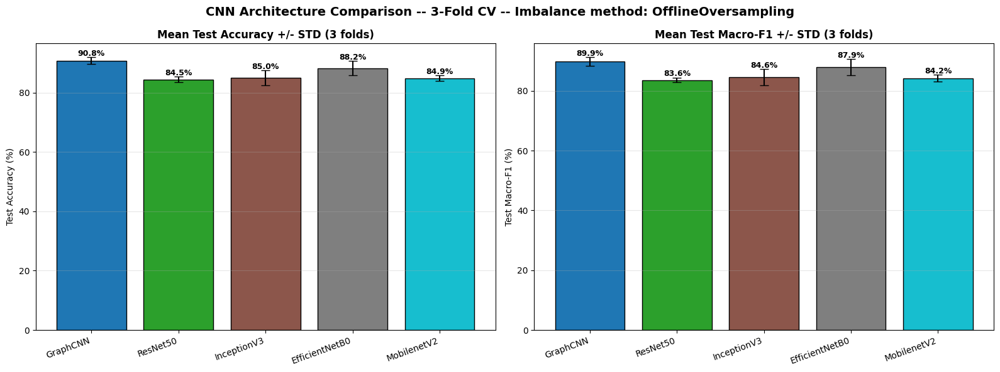

         Model  CV Test Accuracy (%) mean  CV Test Accuracy (%) std  CV Test Balanced Accuracy (%) mean  CV Test Balanced Accuracy (%) std  CV Test Macro-F1 (%) mean  CV Test Macro-F1 (%) std
      GraphCNN                     90.821                     1.163                              90.075                              1.043                     89.867                     1.414
EfficientNetB0                     88.245                     2.386                              88.289                              1.805                     87.864                     2.708
   InceptionV3                     85.024                     2.551                              85.560                              2.842                     84.563                     2.678
   MobilenetV2                     84.863                     0.958                              84.643                              1.698                     84.215                     1.123
      ResNet50                     84.46

In [ ]:
CNN_BACKBONE_BUILDERS = {
    'GraphCNN':         build_graph_cnn,
    'ResNet50':         build_resnet50,
    'InceptionV3':      build_inception_v3,
    'EfficientNetB0':   build_efficientnet_b0,
    'MobilenetV2':      build_mobilenetv2,




}

BEST_IMBALANCE_METHOD =  "OfflineOversampling"
best_cfg_for_cv = IMBALANCE_METHODS[BEST_IMBALANCE_METHOD]

print(f'Running {N_CV_FOLDS}-fold CV CNN-architecture comparison using imbalance '
      f'method "{BEST_IMBALANCE_METHOD}" ({CV_EPOCHS} epochs/fold, '
      f'{len(CNN_BACKBONE_BUILDERS)} architectures, '
      f'{len(CNN_BACKBONE_BUILDERS) * N_CV_FOLDS} fold-trainings total)...')

cnn_cv_results = {}

for model_name, builder in CNN_BACKBONE_BUILDERS.items():
    print(f'\n{"="*65}\nArchitecture: {model_name}\n{"="*65}')
    fold_val_metrics, fold_test_metrics = [], []

    for fold_i, (tr_idx, va_idx) in enumerate(cv_splits, start=1):
        torch.cuda.empty_cache()
        print(f'\n--- {model_name} | Fold {fold_i}/{N_CV_FOLDS} ---')

        Xf_tr, yf_tr = X_train[tr_idx], y_train[tr_idx]
        Xf_va, yf_va = X_train[va_idx], y_train[va_idx]

        fold_train_loader = build_train_loader_for_method(best_cfg_for_cv, Xf_tr, yf_tr, train_transform)
        fold_val_loader   = build_cv_val_loader(Xf_va, yf_va)
        criterion = build_criterion(best_cfg_for_cv)

        model = builder(NUM_CLASSES, pretrained=False)
        trained_model, hist = train_model(
            model, model_name, fold_train_loader, fold_val_loader, DEVICE,
            criterion=criterion, epochs=CV_EPOCHS, patience=CV_PATIENCE,
            tag=f'{BEST_IMBALANCE_METHOD}_fold{fold_i}')

        _, _, va_preds, va_probs, va_labels = evaluate(
            trained_model, fold_val_loader, nn.CrossEntropyLoss(), DEVICE)
        valf_metrics = compute_fold_metrics(va_labels, va_preds)

        _, _, te_preds, te_probs, te_labels = evaluate(
            trained_model, test_loader, nn.CrossEntropyLoss(), DEVICE)
        testf_metrics = compute_fold_metrics(te_labels, te_preds)

        fold_val_metrics.append(valf_metrics)
        fold_test_metrics.append(testf_metrics)

        print(f'  Fold {fold_i}: CV-Val Acc {valf_metrics["accuracy"]*100:.2f}% | '
              f'Fixed-Test Acc {testf_metrics["accuracy"]*100:.2f}% | '
              f'Fixed-Test Macro-F1 {testf_metrics["f1"]*100:.2f}%')

        del model, trained_model
        torch.cuda.empty_cache()

    val_agg  = aggregate_fold_metrics(fold_val_metrics)
    test_agg = aggregate_fold_metrics(fold_test_metrics)
    cnn_cv_results[model_name] = dict(
        fold_val_metrics=fold_val_metrics, fold_test_metrics=fold_test_metrics,
        val_agg=val_agg, test_agg=test_agg)

    print(f'\n{model_name:<20} | CV-Val Acc: {val_agg["accuracy"][0]*100:.2f}% '
          f'(+/-{val_agg["accuracy"][1]*100:.2f}) | Fixed-Test Acc: '
          f'{test_agg["accuracy"][0]*100:.2f}% (+/-{test_agg["accuracy"][1]*100:.2f}) | '
          f'Fixed-Test Macro-F1: {test_agg["f1"][0]*100:.2f}% (+/-{test_agg["f1"][1]*100:.2f})')

print(f'\n{N_CV_FOLDS}-fold CV CNN-architecture comparison complete!')

# -- Plot CNN architecture comparison (mean +/- std across folds) --
cnn_names       = list(cnn_cv_results.keys())
cnn_test_acc_m  = [cnn_cv_results[m]['test_agg']['accuracy'][0] * 100 for m in cnn_names]
cnn_test_acc_s  = [cnn_cv_results[m]['test_agg']['accuracy'][1] * 100 for m in cnn_names]
cnn_test_f1_m   = [cnn_cv_results[m]['test_agg']['f1'][0]       * 100 for m in cnn_names]
cnn_test_f1_s   = [cnn_cv_results[m]['test_agg']['f1'][1]       * 100 for m in cnn_names]
cnn_test_bal_m  = [cnn_cv_results[m]['test_agg']['balanced_accuracy'][0] * 100 for m in cnn_names]
cnn_test_bal_s  = [cnn_cv_results[m]['test_agg']['balanced_accuracy'][1] * 100 for m in cnn_names]

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle(f'CNN Architecture Comparison -- {N_CV_FOLDS}-Fold CV -- '
             f'Imbalance method: {BEST_IMBALANCE_METHOD}', fontsize=14, fontweight='bold')

colors_cnn = plt.cm.tab10(np.linspace(0, 1, len(cnn_names)))

axes[0].bar(range(len(cnn_names)), cnn_test_acc_m, yerr=cnn_test_acc_s, capsize=5, color=colors_cnn, edgecolor='black')
axes[0].set_xticks(range(len(cnn_names)))
axes[0].set_xticklabels(cnn_names, rotation=20, ha='right', fontsize=10)
axes[0].set_ylabel('Test Accuracy (%)')
axes[0].set_title(f'Mean Test Accuracy +/- STD ({N_CV_FOLDS} folds)', fontweight='bold')
axes[0].grid(alpha=0.3, axis='y')
for i, (v, s) in enumerate(zip(cnn_test_acc_m, cnn_test_acc_s)):
    axes[0].text(i, v + s + 0.5, f'{v:.1f}%', ha='center', fontsize=9, fontweight='bold')

axes[1].bar(range(len(cnn_names)), cnn_test_f1_m, yerr=cnn_test_f1_s, capsize=5, color=colors_cnn, edgecolor='black')
axes[1].set_xticks(range(len(cnn_names)))
axes[1].set_xticklabels(cnn_names, rotation=20, ha='right', fontsize=10)
axes[1].set_ylabel('Test Macro-F1 (%)')
axes[1].set_title(f'Mean Test Macro-F1 +/- STD ({N_CV_FOLDS} folds)', fontweight='bold')
axes[1].grid(alpha=0.3, axis='y')
for i, (v, s) in enumerate(zip(cnn_test_f1_m, cnn_test_f1_s)):
    axes[1].text(i, v + s + 0.5, f'{v:.1f}%', ha='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'cnn_architecture_cv_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

cnn_cv_summary_df = pd.DataFrame({
    'Model': cnn_names,
    'CV Test Accuracy (%) mean': cnn_test_acc_m,          'CV Test Accuracy (%) std': cnn_test_acc_s,
    'CV Test Balanced Accuracy (%) mean': cnn_test_bal_m, 'CV Test Balanced Accuracy (%) std': cnn_test_bal_s,
    'CV Test Macro-F1 (%) mean': cnn_test_f1_m,           'CV Test Macro-F1 (%) std': cnn_test_f1_s,
}).sort_values('CV Test Macro-F1 (%) mean', ascending=False).reset_index(drop=True)

print(cnn_cv_summary_df.round(3).to_string(index=False))
cnn_cv_summary_df.to_csv(OUT_DIR / 'cnn_architecture_comparison_cv.csv', index=False)



## Phase 10: (Excluded)


In [ ]:
#### Excluded

## Phase 11: Training Curves Visualization

## Phase 11: Training Curves (Best Model's Best CV Fold)
Best Model Architecture   : GraphCNN
Best Cross-Validation Fold: Fold 3/3 (CV-Val Acc: 93.71%, Macro-F1: 93.93%)

Re-running training for GraphCNN | Fold 3 to recover its epoch-by-epoch history for plotting...

  Model: GraphCNN | Method: OfflineOversampling_fold3_curvereplay | Fixed LR: 1.0e-03


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [01/25] TLoss:1.8460 TAcc:43.824% VLoss:1.6360 VAcc:49.456%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep01_acc49.46.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [02/25] TLoss:1.4322 TAcc:62.277% VLoss:1.2292 VAcc:68.561%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep02_acc68.56.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [03/25] TLoss:1.2779 TAcc:68.601% VLoss:1.2115 VAcc:70.133%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep03_acc70.13.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [04/25] TLoss:1.1737 TAcc:73.512% VLoss:1.0863 VAcc:77.267%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep04_acc77.27.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [05/25] TLoss:1.1252 TAcc:74.591% VLoss:1.0595 VAcc:78.597%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep05_acc78.60.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [06/25] TLoss:1.0661 TAcc:78.423% VLoss:1.0026 VAcc:81.137%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep06_acc81.14.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [07/25] TLoss:1.0310 TAcc:79.836% VLoss:1.0043 VAcc:81.137%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [08/25] TLoss:1.0064 TAcc:81.176% VLoss:0.9575 VAcc:84.401%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep08_acc84.40.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [09/25] TLoss:0.9583 TAcc:83.780% VLoss:0.9521 VAcc:83.434%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep09_acc83.43.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [10/25] TLoss:0.9521 TAcc:84.263% VLoss:0.9066 VAcc:85.973%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep10_acc85.97.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [11/25] TLoss:0.9155 TAcc:85.491% VLoss:0.8920 VAcc:86.941%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep11_acc86.94.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [12/25] TLoss:0.8958 TAcc:87.128% VLoss:0.9073 VAcc:86.094%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [13/25] TLoss:0.8952 TAcc:87.314% VLoss:0.8971 VAcc:87.424%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [14/25] TLoss:0.8756 TAcc:88.207% VLoss:0.9131 VAcc:84.643%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [15/25] TLoss:0.8556 TAcc:89.137% VLoss:0.8745 VAcc:88.271%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep15_acc88.27.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [16/25] TLoss:0.8478 TAcc:89.025% VLoss:0.8412 VAcc:88.029%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep16_acc88.03.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [17/25] TLoss:0.8185 TAcc:91.034% VLoss:0.8578 VAcc:88.875%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [18/25] TLoss:0.8354 TAcc:89.881% VLoss:0.8297 VAcc:89.480%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep18_acc89.48.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [19/25] TLoss:0.8035 TAcc:91.592% VLoss:0.8281 VAcc:89.722%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep19_acc89.72.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [20/25] TLoss:0.8070 TAcc:90.774% VLoss:0.8338 VAcc:90.085%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [21/25] TLoss:0.8050 TAcc:91.071% VLoss:0.7920 VAcc:91.898%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep21_acc91.90.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [22/25] TLoss:0.7856 TAcc:92.225% VLoss:0.7843 VAcc:90.810%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep22_acc90.81.pth


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [23/25] TLoss:0.7716 TAcc:93.043% VLoss:0.7993 VAcc:90.810%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [24/25] TLoss:0.7678 TAcc:93.043% VLoss:0.8141 VAcc:89.601%


Train:   0%|          | 0/42 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Ep [25/25] TLoss:0.7708 TAcc:93.155% VLoss:0.7809 VAcc:91.415%
  -> Checkpoint saved to Drive & Local: GraphCNN_OfflineOversampling_fold3_curvereplay_ep25_acc91.41.pth
Training time: 22.2 min


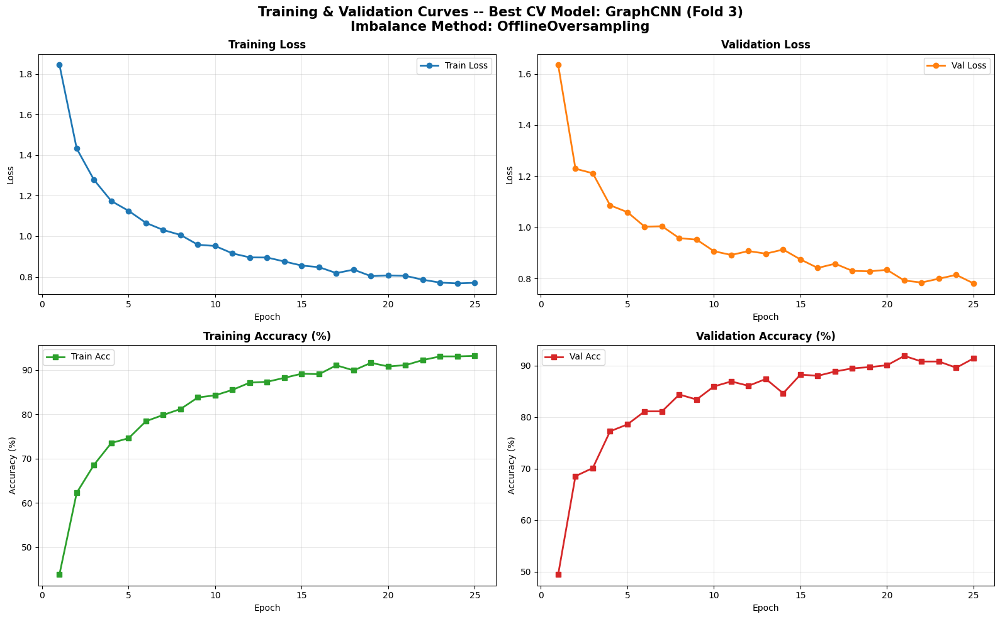

In [ ]:
print("## Phase 11: Training Curves (Best Model's Best CV Fold)")

# 1. Identify the best-performing architecture from the Phase 9b CV comparison
best_model_name = cnn_cv_summary_df.iloc[0]['Model']

# 2. Identify that architecture's best-performing CV fold (by validation macro-F1)
fold_metrics_list = cnn_cv_results[best_model_name]['fold_val_metrics']
best_fold_idx = int(np.argmax([m['f1'] for m in fold_metrics_list]))  # 0-indexed
best_fold_num = best_fold_idx + 1  # 1-indexed

best_fold_acc = fold_metrics_list[best_fold_idx]['accuracy'] * 100
best_fold_f1 = fold_metrics_list[best_fold_idx]['f1'] * 100

print(f"Best Model Architecture   : {best_model_name}")
print(f"Best Cross-Validation Fold: Fold {best_fold_num}/{N_CV_FOLDS} "
      f"(CV-Val Acc: {best_fold_acc:.2f}%, Macro-F1: {best_fold_f1:.2f}%)")


print(f"\nRe-running training for {best_model_name} | Fold {best_fold_num} "
      f"to recover its epoch-by-epoch history for plotting...")

torch.manual_seed(SEED)
np.random.seed(SEED)
torch.cuda.empty_cache()

tr_idx, va_idx = cv_splits[best_fold_idx]
Xf_tr, yf_tr = X_train[tr_idx], y_train[tr_idx]
Xf_va, yf_va = X_train[va_idx], y_train[va_idx]

fold_train_loader = build_train_loader_for_method(best_cfg_for_cv, Xf_tr, yf_tr, train_transform)
fold_val_loader = build_cv_val_loader(Xf_va, yf_va)
criterion = build_criterion(best_cfg_for_cv)

best_fold_builder = CNN_BACKBONE_BUILDERS[best_model_name]
curve_replay_model = best_fold_builder(NUM_CLASSES, pretrained=False)

_, best_history = train_model(
    curve_replay_model, best_model_name, fold_train_loader, fold_val_loader, DEVICE,
    criterion=criterion, epochs=CV_EPOCHS, patience=CV_PATIENCE,
    tag=f'{BEST_IMBALANCE_METHOD}_fold{best_fold_num}_curvereplay')

del curve_replay_model
torch.cuda.empty_cache()

# 4. Plot the recovered curves
epochs_range = range(1, len(best_history['train_loss']) + 1)

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle(
    f"Training & Validation Curves -- Best CV Model: {best_model_name} (Fold {best_fold_num})\n"
    f"Imbalance Method: {BEST_IMBALANCE_METHOD}",
    fontsize=15, fontweight='bold'
)

axes[0, 0].plot(epochs_range, best_history['train_loss'], 'o-', color='#1F77B4', lw=2, label='Train Loss')
axes[0, 0].set_title('Training Loss', fontweight='bold')
axes[0, 0].set_xlabel('Epoch'); axes[0, 0].set_ylabel('Loss')
axes[0, 0].grid(True, alpha=0.3); axes[0, 0].legend()

axes[0, 1].plot(epochs_range, best_history['val_loss'], 'o-', color='#FF7F0E', lw=2, label='Val Loss')
axes[0, 1].set_title('Validation Loss', fontweight='bold')
axes[0, 1].set_xlabel('Epoch'); axes[0, 1].set_ylabel('Loss')
axes[0, 1].grid(True, alpha=0.3); axes[0, 1].legend()

axes[1, 0].plot(epochs_range, best_history['train_acc'], 's-', color='#2CA02C', lw=2, label='Train Acc')
axes[1, 0].set_title('Training Accuracy (%)', fontweight='bold')
axes[1, 0].set_xlabel('Epoch'); axes[1, 0].set_ylabel('Accuracy (%)')
axes[1, 0].grid(True, alpha=0.3); axes[1, 0].legend()

axes[1, 1].plot(epochs_range, best_history['val_acc'], 's-', color='#D62728', lw=2, label='Val Acc')
axes[1, 1].set_title('Validation Accuracy (%)', fontweight='bold')
axes[1, 1].set_xlabel('Epoch'); axes[1, 1].set_ylabel('Accuracy (%)')
axes[1, 1].grid(True, alpha=0.3); axes[1, 1].legend()

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'best_model_best_fold_training_curves.png', dpi=300, bbox_inches='tight')
plt.show()


## Phase 12: Individual Model Evaluation (Test Set)

Metrics include **balanced accuracy** and **macro-averaged** precision/recall/F1 (in addition to standard accuracy), since these are far more informative than plain accuracy on an imbalanced test set.

In [ ]:
print("## Phase 12: Individual Model Evaluation (CV Class-Wise Averages)")


def compute_metrics(y_true, y_pred, y_probs, class_names):
    """Per-fold classification metrics, including multi-class macro ROC-AUC."""
    metrics = {
        'accuracy': accuracy_score(y_true, y_pred),
        'balanced_accuracy': balanced_accuracy_score(y_true, y_pred),
        'precision': precision_score(y_true, y_pred, average='macro', zero_division=0),
        'recall': recall_score(y_true, y_pred, average='macro', zero_division=0),
        'f1': f1_score(y_true, y_pred, average='macro', zero_division=0),
        'mcc': matthews_corrcoef(y_true, y_pred),
        'kappa': cohen_kappa_score(y_true, y_pred),
    }
    try:
        metrics['roc_auc'] = roc_auc_score(
            y_true, y_probs, multi_class='ovr', average='macro',
            labels=list(range(len(class_names))))
    except ValueError:
        metrics['roc_auc'] = float('nan')
    return metrics


criterion_eval = nn.CrossEntropyLoss()

cv_fold_predictions = {}  # model_name -> list of per-fold {'preds','probs','labels'} (Phase 13/14 use this)
cv_fold_metrics = {}      # model_name -> list of per-fold metric dicts (mean +/- std reporting)
cv_class_reports = {}     # model_name -> class-wise averaged classification-report DataFrame

for model_name, builder in CNN_BACKBONE_BUILDERS.items():
    print(f"\nEvaluating saved CV-fold checkpoints for {model_name}...")

    fold_reports = []
    fold_pred_list = []
    fold_metric_list = []

    for fold_i, (tr_idx, va_idx) in enumerate(cv_splits, start=1):
        Xf_va, yf_va = X_train[va_idx], y_train[va_idx]
        fold_val_loader = build_cv_val_loader(Xf_va, yf_va)

        # Load the checkpoint Phase 9b already saved for this model/fold
        ckpt_path = OUT_DIR / 'models' / f'{model_name}_{BEST_IMBALANCE_METHOD}_fold{fold_i}_best.pth'
        if not ckpt_path.exists():
            raise FileNotFoundError(
                f'Missing CV checkpoint: {ckpt_path}. Ensure Phase 9b has been run first.')

        model = builder(NUM_CLASSES, pretrained=False).to(DEVICE)
        state = torch.load(ckpt_path, map_location=DEVICE)
        model.load_state_dict(state['model_state_dict'] if 'model_state_dict' in state else state)

        _, _, va_preds, va_probs, va_labels = evaluate(model, fold_val_loader, criterion_eval, DEVICE)

        # Per-class report for this fold
        f_rep = classification_report(va_labels, va_preds, target_names=CLASS_NAMES,
                                       output_dict=True, zero_division=0)
        fold_reports.append(pd.DataFrame(f_rep).T)

        fold_pred_list.append({'preds': va_preds, 'probs': va_probs, 'labels': va_labels})
        fold_metric_list.append(compute_metrics(va_labels, va_preds, va_probs, CLASS_NAMES))

        del model
        torch.cuda.empty_cache()

    cv_fold_predictions[model_name] = fold_pred_list
    cv_fold_metrics[model_name] = fold_metric_list

    # -- Class-wise AVERAGE across the N_CV_FOLDS folds --
    avg_report_df = pd.concat(fold_reports).groupby(level=0).mean(numeric_only=True)
    ordered_idx = CLASS_NAMES + ['accuracy', 'macro avg', 'weighted avg']
    avg_report_df = avg_report_df.reindex([i for i in ordered_idx if i in avg_report_df.index])
    cv_class_reports[model_name] = avg_report_df

    print(f"\n=== Class-Wise CV Average Report: {model_name} ===")
    print(avg_report_df.round(4))
    avg_report_df.to_csv(OUT_DIR / f'per_class_cv_avg_{model_name}.csv')

# -- Overall CV performance summary: mean +/- std across the folds --
summary_rows = []
for model_name, fmetrics in cv_fold_metrics.items():
    agg = aggregate_fold_metrics(fmetrics)  # reuses Phase 9's helper -> {key: (mean, std)}
    auc_mean, auc_std = agg['roc_auc']
    summary_rows.append({
        'Model': model_name,
        'CV Accuracy (%)': f"{agg['accuracy'][0]*100:.3f} +/- {agg['accuracy'][1]*100:.3f}",
        'CV Bal. Accuracy (%)': f"{agg['balanced_accuracy'][0]*100:.3f} +/- {agg['balanced_accuracy'][1]*100:.3f}",
        'CV Precision (%)': f"{agg['precision'][0]*100:.3f} +/- {agg['precision'][1]*100:.3f}",
        'CV Recall (%)': f"{agg['recall'][0]*100:.3f} +/- {agg['recall'][1]*100:.3f}",
        'CV F1 (%)': f"{agg['f1'][0]*100:.3f} +/- {agg['f1'][1]*100:.3f}",
        'CV MCC': f"{agg['mcc'][0]:.4f} +/- {agg['mcc'][1]:.4f}",
        'CV Cohen Kappa': f"{agg['kappa'][0]:.4f} +/- {agg['kappa'][1]:.4f}",
        'CV ROC-AUC': f"{auc_mean:.4f} +/- {auc_std:.4f}" if not np.isnan(auc_mean) else "N/A",
    })

cv_overall_metrics_df = pd.DataFrame(summary_rows)
print("\n=== Overall Cross-Validation Performance Summary (Mean +/- STD across folds) ===")
print(cv_overall_metrics_df.to_string(index=False))
cv_overall_metrics_df.to_csv(OUT_DIR / 'cv_overall_metrics_summary.csv', index=False)



## Phase 12: Individual Model Evaluation (CV Class-Wise Averages)

Evaluating saved CV-fold checkpoints for GraphCNN...


Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]


=== Class-Wise CV Average Report: GraphCNN ===
                precision  recall  f1-score   support
Chandramallika     0.9092  0.9238    0.9158   74.3333
Cosmos Phul        0.9242  0.8977    0.9094   65.3333
Gada               0.7899  0.8297    0.8054   25.3333
Golap              0.9143  0.8041    0.8550   95.3333
Jaba               0.9054  0.9625    0.9329   88.6667
Kagoj Phul         0.9622  0.9431    0.9524   35.3333
Noyontara          0.9766  0.9536    0.9647   28.6667
Radhachura         0.9647  0.9461    0.9552   68.0000
Rangan             0.9151  0.9431    0.9282   82.3333
Salvia             0.9535  0.9742    0.9635  103.3333
Sandhyamani        0.9609  0.9656    0.9631   67.6667
Surjomukhi         0.9615  1.0000    0.9801   24.6667
Zinnia             0.9240  0.9318    0.9273   68.3333
accuracy           0.9275  0.9275    0.9275    0.9275
macro avg          0.9278  0.9289    0.9272  827.3333
weighted avg       0.9292  0.9275    0.9272  827.3333

Evaluating saved CV-fold checkpoi

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]


=== Class-Wise CV Average Report: ResNet50 ===
                precision  recall  f1-score   support
Chandramallika     0.8270  0.8207    0.8216   74.3333
Cosmos Phul        0.7961  0.9692    0.8732   65.3333
Gada               0.8432  0.5954    0.6711   25.3333
Golap              0.7989  0.7657    0.7799   95.3333
Jaba               0.8929  0.8983    0.8907   88.6667
Kagoj Phul         0.9448  0.8111    0.8727   35.3333
Noyontara          0.8929  0.8846    0.8843   28.6667
Radhachura         0.9216  0.8922    0.9062   68.0000
Rangan             0.8770  0.7931    0.8246   82.3333
Salvia             0.9054  0.9806    0.9411  103.3333
Sandhyamani        0.8711  0.9458    0.9058   67.6667
Surjomukhi         0.9643  0.9589    0.9598   24.6667
Zinnia             0.8241  0.7513    0.7829   68.3333
accuracy           0.8610  0.8610    0.8610    0.8610
macro avg          0.8738  0.8513    0.8549  827.3333
weighted avg       0.8662  0.8610    0.8580  827.3333

Evaluating saved CV-fold checkpoi

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]


=== Class-Wise CV Average Report: InceptionV3 ===
                precision  recall  f1-score   support
Chandramallika     0.8330  0.8924    0.8570   74.3333
Cosmos Phul        0.9226  0.9082    0.9152   65.3333
Gada               0.7453  0.8821    0.8073   25.3333
Golap              0.8237  0.6996    0.7554   95.3333
Jaba               0.8482  0.9098    0.8747   88.6667
Kagoj Phul         0.8062  0.9056    0.8432   35.3333
Noyontara          0.8243  0.9302    0.8713   28.6667
Radhachura         0.9576  0.8775    0.9154   68.0000
Rangan             0.8940  0.8545    0.8706   82.3333
Salvia             0.9387  0.9355    0.9369  103.3333
Sandhyamani        0.9194  0.8232    0.8615   67.6667
Surjomukhi         0.9284  0.9733    0.9481   24.6667
Zinnia             0.8176  0.8299    0.8217   68.3333
accuracy           0.8666  0.8666    0.8666    0.8666
macro avg          0.8661  0.8786    0.8676  827.3333
weighted avg       0.8746  0.8666    0.8663  827.3333

Evaluating saved CV-fold check

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]


=== Class-Wise CV Average Report: EfficientNetB0 ===
                precision  recall  f1-score   support
Chandramallika     0.9063  0.9055    0.9048   74.3333
Cosmos Phul        0.9270  0.8320    0.8738   65.3333
Gada               0.7123  0.8831    0.7722   25.3333
Golap              0.9131  0.7064    0.7914   95.3333
Jaba               0.8689  0.9321    0.8962   88.6667
Kagoj Phul         0.8839  0.8291    0.8438   35.3333
Noyontara          0.9274  0.8723    0.8973   28.6667
Radhachura         0.9564  0.9559    0.9557   68.0000
Rangan             0.8386  0.9228    0.8716   82.3333
Salvia             0.9314  0.9774    0.9531  103.3333
Sandhyamani        0.9308  0.9115    0.9203   67.6667
Surjomukhi         0.9630  0.9867    0.9744   24.6667
Zinnia             0.8869  0.8830    0.8833   68.3333
accuracy           0.8904  0.8904    0.8904    0.8904
macro avg          0.8958  0.8921    0.8875  827.3333
weighted avg       0.9010  0.8904    0.8898  827.3333

Evaluating saved CV-fold ch

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]

Eval:   0%|          | 0/13 [00:00<?, ?it/s]


=== Class-Wise CV Average Report: MobilenetV2 ===
                precision  recall  f1-score   support
Chandramallika     0.8429  0.8520    0.8453   74.3333
Cosmos Phul        0.9134  0.8277    0.8533   65.3333
Gada               0.7859  0.7236    0.6908   25.3333
Golap              0.8366  0.6958    0.7594   95.3333
Jaba               0.8527  0.9212    0.8840   88.6667
Kagoj Phul         0.8832  0.8299    0.8504   35.3333
Noyontara          0.9188  0.8378    0.8731   28.6667
Radhachura         0.9118  0.9020    0.9032   68.0000
Rangan             0.8579  0.8700    0.8614   82.3333
Salvia             0.9463  0.9451    0.9453  103.3333
Sandhyamani        0.8985  0.9116    0.9030   67.6667
Surjomukhi         0.8935  0.9728    0.9302   24.6667
Zinnia             0.7338  0.8195    0.7731   68.3333
accuracy           0.8574  0.8574    0.8574    0.8574
macro avg          0.8673  0.8545    0.8517  827.3333
weighted avg       0.8686  0.8574    0.8568  827.3333

=== Overall Cross-Validation P

## Phase 13: Confusion Matrices

## Phase 13: Confusion Matrices (CV Average)


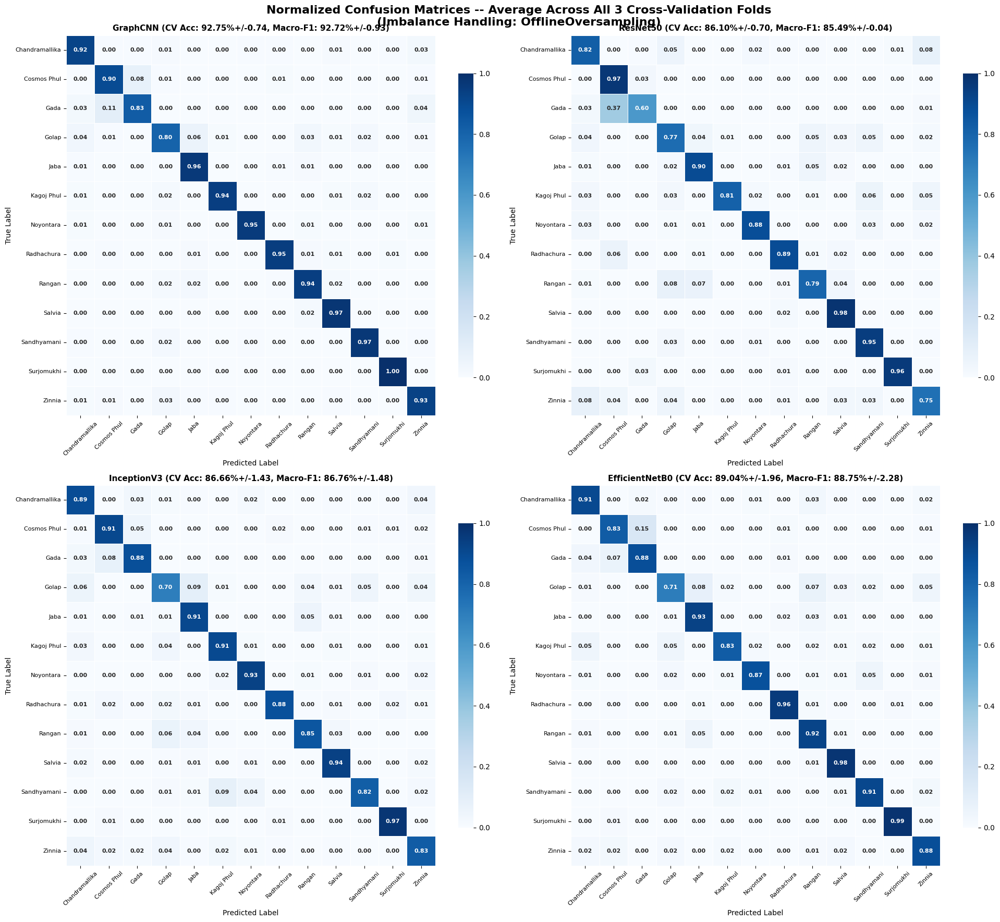

In [ ]:
print("## Phase 13: Confusion Matrices (CV Average)")


def fold_normalized_confusion_matrices(fold_preds, n_classes):
    """Row-normalized confusion matrix for each fold (NaN rows for any class
    absent from a fold's held-out split are ignored when averaging)."""
    mats = []
    for fp in fold_preds:
        cm = confusion_matrix(fp['labels'], fp['preds'], labels=list(range(n_classes))).astype(float)
        row_sums = cm.sum(axis=1, keepdims=True)
        with np.errstate(invalid='ignore', divide='ignore'):
            cm_norm = np.where(row_sums > 0, cm / row_sums, np.nan)
        mats.append(cm_norm)
    return np.array(mats)  # shape (n_folds, n_classes, n_classes)


fig, axes = plt.subplots(2, 2, figsize=(20, 18))
fig.suptitle(
    f"Normalized Confusion Matrices -- Average Across All {N_CV_FOLDS} Cross-Validation Folds\n"
    f"(Imbalance Handling: {BEST_IMBALANCE_METHOD})",
    fontsize=16, fontweight='bold'
)

for ax, model_name in zip(axes.flatten(), CNN_BACKBONE_BUILDERS.keys()):
    fold_mats = fold_normalized_confusion_matrices(cv_fold_predictions[model_name], NUM_CLASSES)
    mean_cm = np.nanmean(fold_mats, axis=0)

    agg = aggregate_fold_metrics(cv_fold_metrics[model_name])
    acc_m, acc_s = agg['accuracy'][0] * 100, agg['accuracy'][1] * 100
    f1_m, f1_s = agg['f1'][0] * 100, agg['f1'][1] * 100

    sns.heatmap(
        mean_cm, annot=True, fmt='.2f', cmap='Blues',
        xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
        ax=ax, linewidths=0.5, cbar_kws={'shrink': 0.8},
        annot_kws={'size': 8, 'weight': 'bold'}, vmin=0, vmax=1
    )
    ax.set_title(f"{model_name} (CV Acc: {acc_m:.2f}%+/-{acc_s:.2f}, Macro-F1: {f1_m:.2f}%+/-{f1_s:.2f})",
                 fontweight='bold', fontsize=11)
    ax.set_xlabel('Predicted Label', fontsize=10)
    ax.set_ylabel('True Label', fontsize=10)
    ax.tick_params(axis='x', rotation=45, labelsize=8)
    ax.tick_params(axis='y', rotation=0, labelsize=8)

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'confusion_matrices_cv_average.png', dpi=300, bbox_inches='tight')
plt.show()



## Phase 14: ROC & Precision-Recall Curves (Multi-Class OvR)

Precision-Recall curves are included alongside ROC curves because PR curves are more informative than ROC when classes are imbalanced -- ROC-AUC can look deceptively good on the minority classes even when precision is poor.

## Phase 14: ROC & Precision-Recall Curves (CV Average)


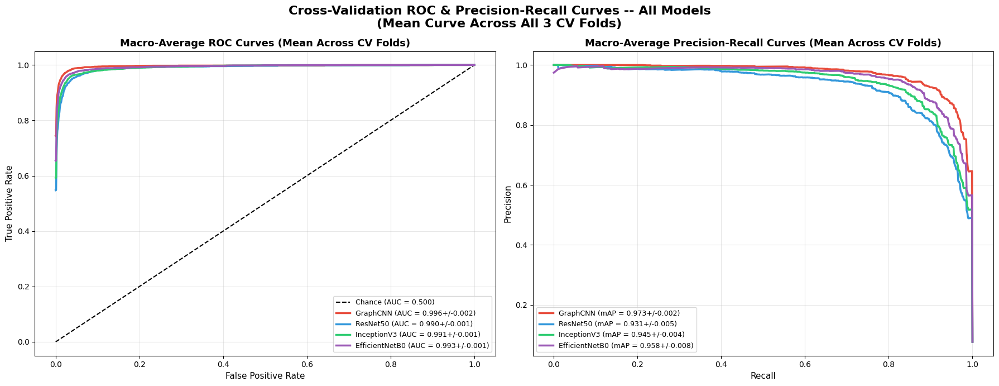

In [ ]:
print("## Phase 14: ROC & Precision-Recall Curves (CV Average)")

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle(
    f"Cross-Validation ROC & Precision-Recall Curves -- All Models\n"
    f"(Mean Curve Across All {N_CV_FOLDS} CV Folds)",
    fontsize=16, fontweight='bold'
)

model_colors = ['#E74C3C', '#3498DB', '#2ECC71', '#9B59B6']
grid = np.linspace(0, 1, 1000)

ax_roc, ax_pr = axes
ax_roc.plot([0, 1], [0, 1], 'k--', lw=1.5, label='Chance (AUC = 0.500)')

for model_name, color in zip(CNN_BACKBONE_BUILDERS.keys(), model_colors):
    fold_tprs, fold_precisions, fold_aucs, fold_aps = [], [], [], []

    for fp in cv_fold_predictions[model_name]:
        y_bin = label_binarize(fp['labels'], classes=range(NUM_CLASSES))

        # macro-average ROC across classes for this one fold
        mean_tpr_fold = np.zeros_like(grid)
        for c in range(NUM_CLASSES):
            fpr, tpr, _ = roc_curve(y_bin[:, c], fp['probs'][:, c])
            mean_tpr_fold += np.interp(grid, fpr, tpr)
        mean_tpr_fold /= NUM_CLASSES
        fold_tprs.append(mean_tpr_fold)
        fold_aucs.append(auc(grid, mean_tpr_fold))

        # macro-average PR across classes for this one fold
        mean_prec_fold = np.zeros_like(grid)
        for c in range(NUM_CLASSES):
            precision, recall, _ = precision_recall_curve(y_bin[:, c], fp['probs'][:, c])
            mean_prec_fold += np.interp(grid, recall[::-1], precision[::-1])
        mean_prec_fold /= NUM_CLASSES
        fold_precisions.append(mean_prec_fold)
        fold_aps.append(np.mean([average_precision_score(y_bin[:, c], fp['probs'][:, c])
                                  for c in range(NUM_CLASSES)]))

    # -- average across the N_CV_FOLDS folds --
    mean_tpr = np.mean(fold_tprs, axis=0)
    auc_m, auc_s = np.mean(fold_aucs), np.std(fold_aucs)
    ax_roc.plot(grid, mean_tpr, color=color, lw=2.5,
                label=f"{model_name} (AUC = {auc_m:.3f}+/-{auc_s:.3f})")

    mean_precision = np.mean(fold_precisions, axis=0)
    ap_m, ap_s = np.mean(fold_aps), np.std(fold_aps)
    ax_pr.plot(grid, mean_precision, color=color, lw=2.5,
               label=f"{model_name} (mAP = {ap_m:.3f}+/-{ap_s:.3f})")

ax_roc.set_title('Macro-Average ROC Curves (Mean Across CV Folds)', fontsize=13, fontweight='bold')
ax_roc.set_xlabel('False Positive Rate', fontsize=11)
ax_roc.set_ylabel('True Positive Rate', fontsize=11)
ax_roc.legend(fontsize=9, loc='lower right')
ax_roc.grid(True, alpha=0.3)

ax_pr.set_title('Macro-Average Precision-Recall Curves (Mean Across CV Folds)', fontsize=13, fontweight='bold')
ax_pr.set_xlabel('Recall', fontsize=11)
ax_pr.set_ylabel('Precision', fontsize=11)
ax_pr.legend(fontsize=9, loc='lower left')
ax_pr.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(OUT_DIR / 'figures' / 'roc_pr_curves_cv_average.png', dpi=300, bbox_inches='tight')
plt.show()
